# Prediction Models for the Stock Market 
## Certain parts of the notebook contain code that took awhile to run or require a GPU to run. We would not reccomend running them. We only ran them once and outputted a csv for later use.

# Section 0: Set-Up

In [3]:
!pip --version

pip 21.1.3 from /usr/local/lib/python3.7/dist-packages/pip (python 3.7)


In [ ]:
!pip install pandas
!pip install numpy
!pip install scipy
!pip install seaborn
!pip install matplotlib
!pip install matplotlib.pyplot
!pip install datetime
!pip install pandasql
!pip install yfinance
!pip install yahoo_fin
!pip install requests_html
!pip install prettytable
!pip install feedparser 
!pip install ftplib
!pip install io
!pip install json 
!pip install requests

In [5]:
import pandas as pd
import scipy
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import datetime as dt
import pandasql as ps
import re
import requests
import multitasking
import yfinance as yf
import requests_html
import yahoo_fin.stock_info as si
import math
from lxml import html
import json
import prettytable
from bs4 import BeautifulSoup
import string


In [ ]:
apple = yf.Ticker("aapl")
apple.info

# Section 1: Data Acquisition

We are going to work with data relating to companies that are currently in the S&P 500. Thus, the first dataset we require is a list of all the companies currently in the S&P 500. We will extract this from the Wikipedia page. As we want to use this dataset to extract historical data using the yfinance API, we must generate a list of tickers: this is what the API requests take as the primary input. To extract this data, we first create a DOM Tree from HTML content of the Wikipedia page:

In [ ]:
w = requests.get('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies')
dom_tree = html.fromstring(w.content)
print(dom_tree)

Next, we need to generate our list of tickers to be used by the yfinance API. We do this via an X-Path. We also need to ensure our tickers are in lower case so they are accepted as valid inputs to the API:

In [8]:
x_path = "//*[@id='constituents']/tbody/tr/td[1]/a/text()"
ticker_list = dom_tree.xpath(x_path)
ticker_list = [ticker.lower() for ticker in ticker_list]

The yfinance API supports data requests for multiple tickers at once. To perform such a request we need the primary input to our request to be a single string with all the tickers separated by a single space. We are collecting historical data from 2000 to present:

In [ ]:
tickers = ' '.join(ticker_list)
sp_df = yf.download(tickers, start="2014-01-01" , end="2021-11-30")
sp_df.head(40)

As can be seen in the table above, we have the following information for each trading day, for each stock: opening price, high, low, closing price, adjusted closing price, and volume. We can access more information for a given company by initializing a ticker object from the company's ticker. We want to attach such information that we deem relevant to the dataframe defined above and remove the adjusted closing price from the dataframe:

In [10]:
sp_df = sp_df.stack().reset_index().rename(columns={"level_1":"Ticker"})
sp_df

,Date,Ticker,Adj Close,Close,High,Low,Open,Volume
0,2014-01-02,A,37.496197,40.207439,40.844063,40.164520,40.844063,2678848.0
1,2014-01-02,AAL,23.907921,25.360001,25.820000,25.059999,25.070000,8997900.0
2,2014-01-02,AAP,106.586082,109.739998,111.879997,109.290001,110.360001,542700.0
3,2014-01-02,AAPL,17.516603,19.754642,19.893929,19.715000,19.845715,234684800.0
4,2014-01-02,ABBV,37.301117,51.980000,52.330002,51.520000,52.119999,4569100.0
...,...,...,...,...,...,...,...,...
982611,2021-11-29,YUM,125.250000,125.250000,126.290001,124.059998,125.360001,1249100.0
982612,2021-11-29,ZBH,123.500000,123.500000,126.870003,123.430000,126.769997,1428800.0
982613,2021-11-29,ZBRA,607.200012,607.200012,609.409973,588.219971,597.460022,262700.0
982614,2021-11-29,ZION,64.910004,64.910004,65.669998,63.830002,65.360001,1662400.0


In [ ]:
sp_df['Date'] = pd.to_datetime(sp_df['Date'])
sp_df = sp_df[['Ticker', 'Date', 'Open', 'High', 'Low', 'Close', 'Adj Close']]
sp_df

In [ ]:
sp_df['Year'], sp_df['Month'] = sp_df['Date'].dt.year, sp_df['Date'].dt.month

sp_train_df = sp_df[sp_df.Date.isin(pd.DataFrame(sp_df.groupby(by=['Ticker', 'Year', 'Month'])['Date'].max(), columns=['Date']).reset_index()['Date'])].reset_index()[['Ticker', 'Year', 'Month', 'Adj Close']]

sp_train_df = sp_train_df.pivot_table(index=['Ticker', 'Year'], columns='Month', values=['Adj Close']).reset_index().droplevel(level=1, axis=1)

sp_train_df['jan_close'], sp_train_df['feb_close'], sp_train_df['mar_close'], sp_train_df['apr_close'], sp_train_df['may_close'], sp_train_df['jun_close'], sp_train_df['jul_close'], sp_train_df['aug_close'], sp_train_df['sep_close'], sp_train_df['oct_close'], sp_train_df['nov_close'], sp_train_df['dec_close'] = sp_train_df.iloc[:, 2], sp_train_df.iloc[:, 3], sp_train_df.iloc[:, 4], sp_train_df.iloc[:, 5], sp_train_df.iloc[:, 6], sp_train_df.iloc[:, 7], sp_train_df.iloc[:, 8], sp_train_df.iloc[:, 9], sp_train_df.iloc[:, 10], sp_train_df.iloc[:, 11], sp_train_df.iloc[:, 12], sp_train_df.iloc[:, 13]

sp_train_df = sp_train_df[['Ticker', 'Year', 'jan_close', 'feb_close', 'mar_close', 'apr_close', 'may_close', 'jun_close', 'jul_close', 'aug_close', 'sep_close', 'oct_close', 'nov_close', 'dec_close']]

sp_train_df


In [ ]:
sp_train_df.rename(columns={'Ticker': 'ticker', 'Year':'year'}, inplace=True)
sp_train_df

In [ ]:
sp_train_df['percentage_change'] = ((sp_train_df['apr_close'] - sp_train_df['jan_close']) / sp_train_df['jan_close']) * 100
sp_train_df['direction'] = np.where((((sp_train_df['apr_close'] - sp_train_df['jan_close']) / sp_train_df['jan_close']) * 100) > 0, 1, -1)
sp_train_df

In [ ]:
sp_train_df = pd.read_csv('stocks_sdf.csv')
sp_train_df = sp_train_df.iloc[:, 1:]
sp_train_df

In [18]:
unemployment_df = pd.ExcelFile('Unemployment.xlsx').parse('Sheet1')
cpi_df = pd.ExcelFile('CPI.xlsx').parse('Sheet1')

In [19]:
unemployment_df[['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']] = unemployment_df[['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']].apply(pd.to_numeric)
unemployment_df['Annual'] = unemployment_df[['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']].mean(axis=1)
unemployment_df = unemployment_df[['Year', 'Annual']]
unemployment_df.rename(columns={'Annual':'unemployment_rate', 'Year':'year'}, inplace=True)
unemployment_df

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,year,unemployment_rate
0,2014,6.158333
1,2015,5.275000
2,2016,4.875000
3,2017,4.350000
4,2018,3.891667
5,2019,3.683333
6,2020,8.108333
7,2021,5.500000


In [20]:
cpi_df['Annual'] = cpi_df[['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']].mean(axis=1)
cpi_df = cpi_df[['Year', 'Annual']]
cpi_df.rename(columns={'Annual':'cpi', 'Year':'year'}, inplace=True)
cpi_df

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


,year,cpi
0,2014,236.736167
1,2015,237.017000
2,2016,240.007167
3,2017,245.119583
4,2018,251.106833
5,2019,255.657417
6,2020,258.811167
7,2021,269.488700


In [22]:
# Total stock Market_cap / GDP 
buffet_indicator = pd.read_excel('buffet.xls')
buffet_indicator.rename(columns={'observation_date': 'Year', 
                                 'WILL5000INDFC_NBD20071001_GDP_NBD20071001' : 'market_cap/gdp'}, inplace = True)
buffet_indicator['Year'] = buffet_indicator['Year'].astype(str)
buffet_indicator['Year'] = buffet_indicator['Year'].str.slice(0,4)
buffet_indicator = buffet_indicator.groupby(['Year']).mean().reset_index()
buffet_indicator.rename(columns={'Year':'year'}, inplace=True)
buffet_indicator

,year,market_cap/gdp
0,2014,1.293413
1,2015,1.347630
2,2016,1.341082
3,2017,1.544038
4,2018,1.674424
5,2019,1.721350
6,2020,1.973838
7,2021,2.445980


Adding options volume to the data --> Does a year over year increase in options volume affect anything...

## Code has been commented out. I combined csv's locally, so the cell will error when run on colab.

In [ ]:
# Also have raw options volume data
# Merge the csv together to get an aggreagted optionsd data csv

#import os
#import glob
#import pandas as pd
# Set the working directory with the csv files
#os.chdir("/Users/jackdooley/Documents/Junior Year Classes/CIS 545/Options_Data")
#a = 'csv'
#all_filenames = [i for i in glob.glob('*.{}'.format(a))]

#combine the wanted file names
#combined_csv = pd.concat([pd.read_csv(f) for f in all_filenames ])
#export to csv
#combined_csv.to_csv( "options_vol_combined_csv.csv", index=False, encoding='utf-8-sig')

## DO NOT RUN FILE IS TO BIG FOR COLAB
Adding Twitter Sentiment Scores to the Data. We'll load some data of News articles about popular stocks over the last 12 years. We'll begin by creating a data frame from the us_equities_news_dataset csv that contains news data on popular us equities.

In [ ]:
import csv

news_df = pd.read_csv('us_equities_news_dataset.csv', error_bad_lines=False, nrows= 203926)

In [ ]:
tickers = pd.DataFrame(ticker_list)
tickers.columns = ['ticker']
tickers

news_df['ticker'] = news_df['ticker'].str.lower()

df = news_df.merge(tickers, on = 'ticker', how = 'inner')
news_df = df.drop(columns= ['id', 'category', 'provider', 'url', 'article_id'])
news_df.release_date = pd.to_datetime(news_df.release_date)

news_df

Now that we've cleaned the data, we'll install flair, a sentiment analysis package. 

In [ ]:
!pip install flair
import flair

## DO NOT RUN (Sentiment Analysis will take very long)
# We used a GPU
# The needed csv was downloaded, so we never had to run this code again 
Here we loop throught the rows of the title collumn, finding the sentiment value and score. Then saving them in our dataframe as new collumns for each row. Because sentiment analysis is a hardware intensive task, to shorten the runtime, we only consider the title of each news article.

In [ ]:
sentiment_model = flair.models.TextClassifier.load('en-sentiment')
sentiment = []
confidence = []

for tick in news_df.title.to_list():
  x = flair.data.Sentence(tick)
  sentiment_model.predict(x)
  sentiment.append(x.labels[0].value)
  confidence.append(x.labels[0].score)

news_df['sentiment'] = sentiment
news_df['confidnece'] = confidence
news_df


Because we only considered the title of each article, we'll want to drop some non-used collumns. Further, we'll save this new dataframe as csv to avoid this intensive query in the future.

In [ ]:
#news_df.to_csv('news_sentiment')

#news_df_no_content = news_df[['ticker', 'title', 'release_date', 'sentiment', 'confidnece']]
#news_df_no_content.to_csv('news_sentiment_no_content.csv')

Next we want to form this data into a similar structure as our pricing data, by month. Within this proccess we'll average the sentiment and confidence data per month to get an overview on sentiment for that month.

In [23]:
test_df_news = pd.read_csv('news_sentiment_no_content.csv')

In [ ]:
#test_df_news = news_df_no_content
test_df_news['Year'], test_df_news['Month'] = test_df_news['release_date'].dt.year, test_df_news['release_date'].dt.month
test_df_news['sentiment'] = test_df_news['sentiment'].str.replace('POSITIVE','1')
test_df_news['sentiment'] = test_df_news['sentiment'].str.replace('NEGATIVE','0')
test_df_news['sentiment'] = test_df_news['sentiment'].astype(int)


df = test_df_news.groupby(['ticker', 'Year','Month']).mean().reset_index()
df = df.pivot_table(index=['ticker', 'Year'], columns='Month', values=['sentiment', 'confidnece']).reset_index().droplevel(level=1, axis=1)

df['jan_confidence'], df['feb_confidence'], df['mar_confidence'], df['apr_confidence'], df['may_confidence'], df['jun_confidence'], df['jul_confidence'], df['aug_confidence'], df['sep_confidence'], df['oct_confidence'], df['nov_confidence'], df['dec_confidence'], = df.iloc[:, 2], df.iloc[:, 3], df.iloc[:, 4], df.iloc[:, 5], df.iloc[:, 6], df.iloc[:, 7], df.iloc[:, 8], df.iloc[:, 9], df.iloc[:, 10], df.iloc[:, 11], df.iloc[:, 12], df.iloc[:, 13]

df['jan_sentiment'], df['feb_sentiment'], df['mar_sentiment'], df['apr_sentiment'], df['may_sentiment'], df['jun_sentiment'], df['jul_sentiment'], df['aug_sentiment'], df['sep_sentiment'], df['oct_sentiment'], df['nov_sentiment'], df['dec_sentiment'], = df.iloc[:, 14], df.iloc[:, 15], df.iloc[:, 16], df.iloc[:, 17], df.iloc[:, 18], df.iloc[:, 19], df.iloc[:, 20], df.iloc[:, 21], df.iloc[:, 22], df.iloc[:, 23], df.iloc[:, 24], df.iloc[:, 25]


df = df[['ticker', 'Year', 'jan_confidence', 'feb_confidence', 'mar_confidence', 'apr_confidence', 'may_confidence', 'jun_confidence', 'jul_confidence', 'aug_confidence', 'sep_confidence', 'oct_confidence', 'nov_confidence', 'dec_confidence', 'jan_sentiment', 'feb_sentiment', 'mar_sentiment', 'apr_sentiment', 'may_sentiment', 'jun_sentiment', 'jul_sentiment', 'aug_sentiment', 'sep_sentiment','oct_sentiment', 'nov_sentiment', 'dec_sentiment']]

df.to_csv('news_sentiment_by_month.csv')

This data contains a fair amount of NaN's -- months where news was not reported. For these months we'll consider a confidence of 0 and a sentiment of 0.5 (neutral). This assumption we are making is that months in which news was not reported on a company (or our dataset doesn't contain news on that company) we'll consider the sentiment to be neutral, but weighted with zero confidence because of potential other news outlets reporting outside of this dataset.

In [27]:
df = pd.read_csv('news_sentiment_by_month.csv', index_col = [0])
df[['jan_confidence', 'feb_confidence', 'mar_confidence', 'apr_confidence', 'may_confidence', 'jun_confidence', 'jul_confidence', 'aug_confidence', 'sep_confidence', 'oct_confidence', 'nov_confidence', 'dec_confidence']] = df[['jan_confidence', 'feb_confidence', 'mar_confidence', 'apr_confidence', 'may_confidence', 'jun_confidence', 'jul_confidence', 'aug_confidence', 'sep_confidence', 'oct_confidence', 'nov_confidence', 'dec_confidence']].replace(np.nan, 0)
df[['jan_sentiment', 'feb_sentiment', 'mar_sentiment', 'apr_sentiment', 'may_sentiment', 'jun_sentiment', 'jul_sentiment', 'aug_sentiment', 'sep_sentiment','oct_sentiment', 'nov_sentiment', 'dec_sentiment']] = df[['jan_sentiment', 'feb_sentiment', 'mar_sentiment', 'apr_sentiment', 'may_sentiment', 'jun_sentiment', 'jul_sentiment', 'aug_sentiment', 'sep_sentiment','oct_sentiment', 'nov_sentiment', 'dec_sentiment']].replace(np.nan, 0.5)
df

,ticker,Year,jan_confidence,feb_confidence,mar_confidence,apr_confidence,may_confidence,jun_confidence,jul_confidence,aug_confidence,sep_confidence,oct_confidence,nov_confidence,dec_confidence,jan_sentiment,feb_sentiment,mar_sentiment,apr_sentiment,may_sentiment,jun_sentiment,jul_sentiment,aug_sentiment,sep_sentiment,oct_sentiment,nov_sentiment,dec_sentiment
0,a,2012,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.812015,0.918628,0.892676,0.845037,0.967332,0.816895,0.5,0.5,0.500000,0.500000,0.500000,0.5,0.80,0.500000,0.714286,0.416667,0.125000,0.75
1,a,2013,0.900494,0.923459,0.841514,0.907931,0.976874,0.953884,0.857097,0.000000,0.000000,0.000000,0.000000,0.000000,0.3,0.5,0.428571,0.333333,0.714286,0.4,0.20,0.500000,0.500000,0.500000,0.500000,0.50
2,a,2014,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.699949,0.000000,0.000000,0.000000,0.000000,0.5,0.5,0.500000,0.500000,0.500000,0.5,0.50,1.000000,0.500000,0.500000,0.500000,0.50
3,a,2015,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.885530,0.980883,0.5,0.5,0.500000,0.500000,0.500000,0.5,0.50,0.500000,0.500000,0.500000,0.000000,1.00
4,a,2016,0.000000,0.000000,0.000000,0.000000,0.877834,0.978502,0.992455,0.935304,0.983260,0.866147,0.956799,0.000000,0.5,0.5,0.500000,0.500000,0.812500,1.0,0.50,0.666667,1.000000,1.000000,0.666667,0.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2841,zion,2016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.997956,0.829202,0.974483,0.000000,0.5,0.5,0.500000,0.500000,0.500000,0.5,0.50,0.500000,1.000000,0.000000,0.500000,0.50
2842,zion,2017,0.000000,0.857724,0.000000,0.776184,0.787234,0.000000,0.953667,0.863972,0.984658,0.993835,0.000000,0.987950,0.5,1.0,0.500000,0.000000,0.000000,0.5,0.40,0.750000,1.000000,0.333333,0.500000,1.00
2843,zion,2018,0.917900,0.995631,0.000000,0.851261,0.990596,0.000000,0.000000,0.000000,0.845790,0.965895,0.945188,0.968404,0.0,0.0,0.500000,0.333333,0.000000,0.5,0.50,0.500000,0.000000,0.500000,0.250000,0.50
2844,zion,2019,0.903532,0.936785,0.928740,0.995393,0.872828,0.936717,0.916826,0.973247,0.985198,0.895663,0.904507,0.999017,1.0,0.8,1.000000,0.500000,0.250000,1.0,0.25,0.500000,0.000000,0.750000,0.000000,0.00


In [29]:
# Adding options volume data to see how it corresponds to asset pricing
# Get new combined data
options_data = pd.read_csv('options_vol_combined_csv.csv')
#options_data.head(10)
options_data_df = options_data[['Trade Year', 'Underlying','Volume']]
options_data_df = options_data_df.groupby(['Underlying', 'Trade Year']).sum().reset_index()
options_data_df.rename(columns={'Trade Year' : 'year', 'Underlying' : 'ticker', 'Volume' : 'volume'}, inplace=True)
options_data_df

# To do compute the year over year change

,ticker,year,volume
0,A,2014,150011
1,A,2015,100256
2,A,2016,33699
3,A,2017,42861
4,A,2018,74065
...,...,...,...
32884,ZYNE,2020,29585
32885,ZYNE,2021,30623
32886,ZYXI,2019,2018
32887,ZYXI,2020,25180


## Do not run takes long time to run:
## This method formats our data so that it can be merged in the subsequent cells
### All the following code blocks represent merging and cleaning of our data set
#### You should not run these cells, the output of all the merging and n-1 operations is sp_clean_full.csv which is at the end of the section 

In [30]:
def get_eps_for_ticker(ticker):
    try:
        earnings = pd.DataFrame.from_dict(si.get_earnings_history(ticker))
        earnings['startdatetime'] = pd.to_datetime(earnings['startdatetime'])
        earnings['Year'], earnings['Month'] = earnings['startdatetime'].dt.year, earnings['startdatetime'].dt.month
        earnings = earnings.loc[earnings['startdatetimetype'] == 'TNS', ['ticker', 'Year', 'Month', 'epsactual']]
        earnings = earnings.loc[earnings['Year'] >= 2014]
        earnings = pd.DataFrame(earnings.groupby(by=['ticker', 'Year'])['epsactual'].sum()).reset_index().rename(columns={'Year':'year', 'epsactual':'eps'})
        return earnings
    except:
        return None

In [ ]:
ticker_list = si.tickers_sp500()
first_time = True
for ticker in ticker_list:
    if (first_time):
        earnings = get_eps_for_ticker(ticker)
        if earnings is None:
            continue
        first_time = False
    else:
        earnings_sub = get_eps_for_ticker(ticker)
        if earnings_sub is None:
            continue
        earnings = pd.concat([earnings, earnings_sub])

In [ ]:
ticker_data= {}
for ticker in ticker_list:
    try:
        ticker_object = yf.Ticker(ticker)
        temp = pd.DataFrame.from_dict(ticker_object.info, orient="index")
        temp.reset_index(inplace=True)
        temp.columns = ["Attribute", "Recent"]
        ticker_data[ticker] = temp
    except:
        continue
ticker_data

In [ ]:
combined_data = pd.concat(ticker_data)
combined_data = combined_data.reset_index()
combined_data

In [ ]:
del combined_data["level_1"]
combined_data.columns = ["Ticker", "Attribute", "Recent"]
combined_data

,Ticker,Attribute,Recent
0,A,zip,95051
1,A,sector,Healthcare
2,A,fullTimeEmployees,17000
3,A,longBusinessSummary,"Agilent Technologies, Inc. provides applicatio..."
4,A,city,Santa Clara
...,...,...,...
77366,ZTS,bidSize,800
77367,ZTS,dayHigh,233.03
77368,ZTS,regularMarketPrice,232.36
77369,ZTS,preMarketPrice,231.4


In [ ]:
combined_data.rename(columns={'Ticker':'ticker'}, inplace=True)
combined_data

In [ ]:
combined_data.to_csv('combined_data.csv')

In [ ]:
earnings_df = earnings
earnings_df

,ticker,year,eps,index
0,A,2014.0,3.05,NaN
1,A,2015.0,1.73,NaN
2,A,2016.0,1.98,NaN
3,A,2017.0,2.37,NaN
4,A,2018.0,2.79,NaN
...,...,...,...,...
3,ZTS,2017.0,2.18,NaN
4,ZTS,2018.0,3.04,NaN
5,ZTS,2019.0,3.51,NaN
6,ZTS,2020.0,3.86,NaN


In [ ]:
earnings_df.to_csv('earnings.csv')

In [ ]:
earnings_df = pd.read_csv('earnings.csv')
earnings_df

In [ ]:
combined_data = pd.read_csv('combined_data.csv')
combined_data

In [ ]:
news_sentiment_df = pd.read_csv('news_sentiment_by_month.csv')
news_sentiment_df

In [ ]:
del news_sentiment_df["Unnamed: 0"]
news_sentiment_df.rename(columns={'Year':'year'}, inplace=True)
news_sentiment_df

In [ ]:
news_sentiment_df = news_sentiment_df.loc[news_sentiment_df['year'] >= 2014]
news_sentiment_df

In [ ]:
sp_train_df.to_csv('sp_train.csv')

In [ ]:
sp_train_df

In [ ]:
earnings_df['year'] = earnings_df['year'].apply(np.int64)
del earnings_df['index']
earnings_df

In [ ]:
del earnings_df['Unnamed: 0']
earnings_df

In [ ]:
sp_train_df = pd.merge(sp_train_df, earnings_df, how='inner', on=['ticker', 'year'])
sp_train_df

In [ ]:
sp_train_df['p/e'] = sp_train_df[['jan_close', 'feb_close', 'mar_close', 'apr_close', 'may_close', 'jun_close', 'jul_close', 'aug_close', 'sep_close', 'oct_close', 'nov_close', 'dec_close']].mean(axis=1) / sp_train_df.eps
sp_train_df

In [ ]:
del combined_data['Unnamed: 0']
combined_data = combined_data.query('Attribute == "sector" or Attribute == "country" or Attribute == "state"')
combined_data.pivot(index='ticker', columns='Attribute', values='Recent')

In [ ]:
#sp_train_df = sp_train_df.pivot_table(index=['Ticker', 'Year'], columns='Month', values=['Adj Close']).reset_index().droplevel(level=1, axis=1)
combined_data = (combined_data.pivot(index='ticker', columns='Attribute', values='Recent')
                              .reset_index()
                              .reset_index()
                              [['ticker', 'sector', 'country', 'state']]
                )
combined_data

In [ ]:
sp_train_df = pd.merge(sp_train_df, combined_data, how='inner', on='ticker')
sp_train_df

In [ ]:
buffet_indicator['year'] = buffet_indicator['year'].apply(np.int64)
buffet_indicator

,year,market_cap/gdp
0,2014,1.293413
1,2015,1.347630
2,2016,1.341082
3,2017,1.544038
4,2018,1.674424
5,2019,1.721350
6,2020,1.973838
7,2021,2.445980


In [ ]:
options_data_df

,ticker,year,volume
0,A,2014,150011
1,A,2015,100256
2,A,2016,33699
3,A,2017,42861
4,A,2018,74065
...,...,...,...
32884,ZYNE,2020,29585
32885,ZYNE,2021,30623
32886,ZYXI,2019,2018
32887,ZYXI,2020,25180


In [ ]:
sp_train_df = pd.merge(sp_train_df, buffet_indicator, how='inner', on='year')
sp_train_df

In [ ]:
sp_train_df = pd.merge(sp_train_df, options_data_df, how='inner', on=['ticker', 'year'])
sp_train_df

In [ ]:
news_sentiment_df[['jan_confidence', 'feb_confidence', 'mar_confidence', 'apr_confidence', 'may_confidence', 'jun_confidence', 'jul_confidence', 'aug_confidence', 'sep_confidence', 'oct_confidence', 'nov_confidence', 'dec_confidence']] = news_sentiment_df[['jan_confidence', 'feb_confidence', 'mar_confidence', 'apr_confidence', 'may_confidence', 'jun_confidence', 'jul_confidence', 'aug_confidence', 'sep_confidence', 'oct_confidence', 'nov_confidence', 'dec_confidence']].replace(np.nan, 0)

news_sentiment_df[['jan_sentiment', 'feb_sentiment', 'mar_sentiment', 'apr_sentiment', 'may_sentiment', 'jun_sentiment', 'jul_sentiment', 'aug_sentiment', 'sep_sentiment','oct_sentiment', 'nov_sentiment', 'dec_sentiment']] = news_sentiment_df[['jan_sentiment', 'feb_sentiment', 'mar_sentiment', 'apr_sentiment', 'may_sentiment', 'jun_sentiment', 'jul_sentiment', 'aug_sentiment', 'sep_sentiment','oct_sentiment', 'nov_sentiment', 'dec_sentiment']].replace(np.nan, 0.5)

news_sentiment_df

In [ ]:
news_sentiment_df = news_sentiment_df.reset_index()
del news_sentiment_df['index']
news_sentiment_df

In [ ]:
news_sentiment_df['avg_sentiment'] = (news_sentiment_df['jan_sentiment'] + news_sentiment_df['feb_sentiment'] + news_sentiment_df['mar_sentiment'] + news_sentiment_df['apr_sentiment'] + news_sentiment_df['may_sentiment'] + news_sentiment_df['jun_sentiment'] + news_sentiment_df['jul_sentiment'] + news_sentiment_df['aug_sentiment'] + news_sentiment_df['sep_sentiment'] + news_sentiment_df['oct_sentiment'] + news_sentiment_df['nov_sentiment'] + news_sentiment_df['dec_sentiment']) / 12

news_sentiment_df['avg_confidence'] = (news_sentiment_df['jan_confidence'] + news_sentiment_df['feb_confidence'] + news_sentiment_df['mar_confidence'] + news_sentiment_df['apr_confidence'] + news_sentiment_df['may_confidence'] + news_sentiment_df['jun_confidence'] + news_sentiment_df['jul_confidence'] + news_sentiment_df['aug_confidence'] + news_sentiment_df['sep_confidence'] + news_sentiment_df['oct_confidence'] + news_sentiment_df['nov_confidence'] + news_sentiment_df['dec_confidence']) / 12

news_sentiment_df = news_sentiment_df.sort_values(['ticker', 'year'])

i = 1
yearly_percent_change_sentiment = [0]

while i < len(news_sentiment_df):
  if news_sentiment_df.ticker[i] == news_sentiment_df.ticker[i - 1]:
    yearly_percent_change_sentiment.append((news_sentiment_df.avg_sentiment[i] - news_sentiment_df.avg_sentiment[i - 1]) / news_sentiment_df.avg_sentiment[i - 1])
  else:
    yearly_percent_change_sentiment.append(0)
  i = i + 1
news_sentiment_df['yearly_percent_change_sentiment'] = yearly_percent_change_sentiment
news_sentiment_df

In [ ]:
news_sentiment_df['sentiment_score'] = (news_sentiment_df.avg_sentiment - 0.5) * news_sentiment_df.avg_confidence + 0.5
news_sentiment_df

In [ ]:
news_sentiment_df['ticker'] = news_sentiment_df['ticker'].str.upper()
news_sentiment_df

In [ ]:
sp_df = pd.merge(sp_train_df, news_sentiment_df, how='left', on=['ticker', 'year'])
sp_df

In [ ]:
sp_df = sp_df.sort_values(by=['ticker', 'year'])
sp_df

In [ ]:
sp_df = sp_df.reset_index()
del sp_df['index']


Creating n-1 columns. This is key because we want to predict the future stock price using the factors from the past year. Especially when we run linear regression models.

In [ ]:
sp_df['eps_n-1'] = (sp_df.groupby('ticker')
                         ['eps']
                         .shift(1)
                   )

sp_df['p/e_n-1'] = (sp_df.groupby('ticker')
                         ['p/e']
                         .shift(1)
                   )

sp_df['market_cap/gdp_n-1'] = (sp_df.groupby('ticker')
                                    ['market_cap/gdp']
                                    .shift(1)
                              )

sp_df['volume_n-1'] = (sp_df.groupby('ticker')
                            ['volume']
                            .shift(1)
                      )

sp_df['sentiment_score_n-1'] = (sp_df.groupby('ticker')
                                     ['sentiment_score']
                                     .shift(1)
                               )

sp_df['yearly_percent_change_sentiment_n-1'] = (sp_df.groupby('ticker')
                                                     ['yearly_percent_change_sentiment']
                                                     .shift(1)
                                               )

sp_df['start_price'] = sp_df['jan_close']

sp_df['end_price'] = sp_df['apr_close']

sp_df['price_change'] = sp_df['end_price'] - sp_df['start_price']

sp_df

In [ ]:
sp_df.to_csv('sp_df.csv')

In [ ]:
sp_df = pd.merge(sp_df, sp_df.groupby('ticker')['year'].count(), how='inner', on='ticker')
sp_df

In [ ]:
sp_df = sp_df[sp_df.year_y == 8]
del sp_df['year_y']
sp_df.rename(columns={'year_x':'year'}, inplace=True)
sp_df

In [ ]:
sp_df = pd.merge(sp_df, sp_df.groupby('ticker')['sentiment_score'].count(), how='inner', on='ticker')
sp_df

In [ ]:
sp_df = sp_df[sp_df.sentiment_score_y == 7]
del sp_df['sentiment_score_y']
sp_df.rename(columns={'sentiment_score_x':'sentiment_score'}, inplace=True)
sp_df

In [ ]:
sp_df.to_csv('sp_clean_df.csv')

In [ ]:
cpi_df

,year,cpi
0,2014,236.736167
1,2015,237.017000
2,2016,240.007167
3,2017,245.119583
4,2018,251.106833
5,2019,255.657417
6,2020,258.811167
7,2021,269.488700


In [ ]:
unemployment_df

,year,unemployment_rate
0,2014,6.158333
1,2015,5.275000
2,2016,4.875000
3,2017,4.350000
4,2018,3.891667
5,2019,3.683333
6,2020,8.108333
7,2021,5.500000


In [ ]:
sp_df = pd.merge(sp_df, cpi_df, how='inner', on='year')
sp_df

In [ ]:
sp_df = pd.merge(sp_df, unemployment_df, how='inner', on='year')
sp_df

In [ ]:
sp_df['cpi_n-1'] = (sp_df.groupby('ticker')
                         ['cpi']
                         .shift(1)
                   )

sp_df['unemployment_rate_n-1'] = (sp_df.groupby('ticker')
                         ['unemployment_rate']
                         .shift(1)
                   )

sp_df

,ticker,year,jan_close,feb_close,mar_close,apr_close,may_close,jun_close,jul_close,aug_close,...,volume_n-1,sentiment_score_n-1,yearly_percent_change_sentiment_n-1,start_price,end_price,price_change,cpi,unemployment_rate,cpi_n-1,unemployment_rate_n-1
0,A,2014,38.778275,37.964687,37.291145,36.124706,38.063301,38.485432,37.580914,38.297825,...,NaN,NaN,NaN,38.778275,36.124706,-2.653568,236.736167,6.158333,NaN,NaN
1,AAPL,2014,15.900002,16.814430,17.149929,18.854563,20.338593,20.901197,21.501711,23.168289,...,NaN,NaN,NaN,15.900002,18.854563,2.954561,236.736167,6.158333,NaN,NaN
2,ABC,2014,59.105267,59.866894,57.872810,57.511047,64.796059,64.335602,68.098732,68.735878,...,NaN,NaN,NaN,59.105267,57.511047,-1.594219,236.736167,6.158333,NaN,NaN
3,ABT,2014,31.523703,34.206570,33.114502,33.510143,34.608688,35.378540,36.629250,36.733597,...,NaN,NaN,NaN,31.523703,33.510143,1.986441,236.736167,6.158333,NaN,NaN
4,ACN,2014,68.320152,71.287994,68.183319,69.435783,70.500420,69.972435,68.622154,70.162834,...,NaN,NaN,NaN,68.320152,69.435783,1.115631,236.736167,6.158333,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,VRSN,2021,194.070007,194.029999,198.759995,218.770004,219.919998,227.690002,216.369995,216.259995,...,8555.0,0.500000,0.097561,194.070007,218.770004,24.699997,269.488700,5.500000,258.811167,8.108333
1044,VRTX,2021,229.080002,212.550003,214.889999,218.199997,208.630005,201.630005,201.580002,200.289993,...,93354.0,0.503681,-0.281161,229.080002,218.199997,-10.880005,269.488700,5.500000,258.811167,8.108333
1045,XRAY,2021,53.309685,52.891102,63.700451,67.394096,66.805107,63.259998,66.040001,61.700001,...,22703.0,0.502219,0.014023,53.309685,67.394096,14.084412,269.488700,5.500000,258.811167,8.108333
1046,YUM,2021,99.816818,102.311226,106.906487,118.112984,119.051720,114.149536,130.384308,130.512466,...,86521.0,0.506604,-0.007273,99.816818,118.112984,18.296165,269.488700,5.500000,258.811167,8.108333


## OUR FINAL CLEAN DATASET!

In [33]:
sp_df.to_csv('sp_clean_full.csv')

# Section 2: EDA 
- We Perform EDA on the entire dataset sp_clean_full.csv 

## Full Dataset EDA

In [34]:
!apt install libkrb5-dev
!wget https://downloads.apache.org/spark/spark-3.1.2/spark-3.1.2-bin-hadoop3.2.tgz
!tar xf spark-3.1.2-bin-hadoop3.2.tgz
!pip install findspark
!pip install sparkmagic
!pip install pyspark
!pip install pyspark --user
!pip install seaborn --user
!pip install plotly --user
!pip install imageio --user
!pip install folium --user

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  comerr-dev krb5-multidev libgssrpc4 libkadm5clnt-mit11 libkadm5srv-mit11
  libkdb5-9
Suggested packages:
  doc-base krb5-doc krb5-user
The following NEW packages will be installed:
  comerr-dev krb5-multidev libgssrpc4 libkadm5clnt-mit11 libkadm5srv-mit11
  libkdb5-9 libkrb5-dev
0 upgraded, 7 newly installed, 0 to remove and 37 not upgraded.
Need to get 349 kB of archives.
After this operation, 1,992 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libgssrpc4 amd64 1.16-2ubuntu0.2 [54.4 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libkdb5-9 amd64 1.16-2ubuntu0.2 [37.3 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libkadm5srv-mit11 amd64 1.16-2ubuntu0.2 [49.7 kB]
Get:4 http://archive.ubuntu.com/ubuntu bionic-updates/main amd64 libkadm5

In [36]:
import pandas as pd
import scipy
import numpy as np
import time
import json
import math
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

In [44]:
market_data = pd.read_csv('sp_clean_full.csv', index_col=[0])
market_data

,ticker,year,jan_close,feb_close,mar_close,apr_close,may_close,jun_close,jul_close,aug_close,sep_close,oct_close,nov_close,dec_close,percentage_change,direction,eps,p/e,sector,country,state,market_cap/gdp,volume,jan_confidence,feb_confidence,mar_confidence,apr_confidence,may_confidence,jun_confidence,jul_confidence,aug_confidence,sep_confidence,oct_confidence,nov_confidence,dec_confidence,jan_sentiment,feb_sentiment,mar_sentiment,apr_sentiment,may_sentiment,jun_sentiment,jul_sentiment,aug_sentiment,sep_sentiment,oct_sentiment,nov_sentiment,dec_sentiment,avg_sentiment,avg_confidence,yearly_percent_change_sentiment,sentiment_score,eps_n-1,p/e_n-1,market_cap/gdp_n-1,volume_n-1,sentiment_score_n-1,yearly_percent_change_sentiment_n-1,start_price,end_price,price_change,cpi,unemployment_rate,cpi_n-1,unemployment_rate_n-1
0,A,2014,38.778275,37.964687,37.291145,36.124706,38.063301,38.485432,37.580914,38.297825,38.266037,37.124374,40.139034,38.448578,-6.842925,-1,3.05,12.474435,Healthcare,United States,CA,1.293413,150011,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.699949,0.000000,0.000000,0.000000,0.000000,0.500000,0.500000,0.50,0.500000,0.500000,0.500000,0.500000,1.000000,0.500000,0.500000,0.5,0.5,0.541667,0.058329,0.0,0.502430,NaN,NaN,NaN,NaN,NaN,NaN,38.778275,36.124706,-2.653568,236.736167,6.158333,NaN,NaN
1,AAPL,2014,15.900002,16.814430,17.149929,18.854563,20.338593,20.901197,21.501711,23.168289,22.772730,24.411461,26.998556,25.057606,18.582144,1,6.43,3.290164,Technology,United States,CA,1.293413,44991907,0.899155,0.918822,0.887372,0.933725,0.894993,0.915273,0.914117,0.894055,0.904289,0.916787,0.908203,0.926156,0.452381,0.294118,0.36,0.339286,0.421053,0.391304,0.362319,0.297297,0.366071,0.401961,0.5,0.4,0.382149,0.909412,0.0,0.392825,NaN,NaN,NaN,NaN,NaN,NaN,15.900002,18.854563,2.954561,236.736167,6.158333,NaN,NaN
2,ABC,2014,59.105267,59.866894,57.872810,57.511047,64.796059,64.335602,68.098732,68.735878,68.655945,75.859016,81.133575,80.340523,-2.697254,-1,3.97,16.925091,Healthcare,United States,PA,1.293413,34492,0.000000,0.000000,0.000000,0.000000,0.999179,0.841697,0.000000,0.000000,0.000000,0.985626,0.000000,0.000000,0.500000,0.500000,0.50,0.500000,0.000000,1.000000,0.500000,0.500000,0.500000,1.000000,0.5,0.5,0.541667,0.235542,0.0,0.509814,NaN,NaN,NaN,NaN,NaN,NaN,59.105267,57.511047,-1.594219,236.736167,6.158333,NaN,NaN
3,ABT,2014,31.523703,34.206570,33.114502,33.510143,34.608688,35.378540,36.629250,36.733597,36.168343,38.109020,38.913326,39.359200,6.301419,1,2.15,16.599026,Healthcare,United States,IL,1.293413,307236,0.000000,0.000000,0.000000,0.964863,0.000000,0.000000,0.939127,0.941798,0.000000,0.988251,0.000000,0.962146,0.500000,0.500000,0.50,1.000000,0.500000,0.500000,0.750000,0.500000,0.500000,1.000000,0.5,0.0,0.562500,0.399682,0.0,0.524980,NaN,NaN,NaN,NaN,NaN,NaN,31.523703,33.510143,1.986441,236.736167,6.158333,NaN,NaN
4,ACN,2014,68.320152,71.287994,68.183319,69.435783,70.500420,69.972435,68.622154,70.162834,70.387901,71.167824,75.738602,78.353012,1.632946,1,4.66,15.238420,Technology,Ireland,NaN,1.293413,156447,0.000000,0.000000,0.000000,0.000000,0.000000,0.921568,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.500000,0.50,0.500000,0.500000,1.000000,0.500000,0.500000,0.500000,0.500000,0.5,0.5,0.541667,0.076797,0.0,0.503200,NaN,NaN,NaN,NaN,NaN,NaN,68.320152,69.435783,1.115631,236.736167,6.158333,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,VRSN,2021,194.070007,194.029999,198.759995,218.770004,219.919998,227.690002,216.369995,216.259995,205.009995,222.669998,244.460007,NaN,12.727364,1,5.42,39.550654,Technology,United States,VA,2.445980,9745,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.98,29.279608,1.

In [45]:
market_data.sort_values(by=['ticker', 'year'], inplace=True)
market_data.reset_index(inplace=True)
#del market_data['index']
market_data

,index,ticker,year,jan_close,feb_close,mar_close,apr_close,may_close,jun_close,jul_close,aug_close,sep_close,oct_close,nov_close,dec_close,percentage_change,direction,eps,p/e,sector,country,state,market_cap/gdp,volume,jan_confidence,feb_confidence,mar_confidence,apr_confidence,may_confidence,jun_confidence,jul_confidence,aug_confidence,sep_confidence,oct_confidence,nov_confidence,dec_confidence,jan_sentiment,feb_sentiment,mar_sentiment,apr_sentiment,may_sentiment,jun_sentiment,jul_sentiment,aug_sentiment,sep_sentiment,oct_sentiment,nov_sentiment,dec_sentiment,avg_sentiment,avg_confidence,yearly_percent_change_sentiment,sentiment_score,eps_n-1,p/e_n-1,market_cap/gdp_n-1,volume_n-1,sentiment_score_n-1,yearly_percent_change_sentiment_n-1,start_price,end_price,price_change,cpi,unemployment_rate,cpi_n-1,unemployment_rate_n-1
0,0,A,2014,38.778275,37.964687,37.291145,36.124706,38.063301,38.485432,37.580914,38.297825,38.266037,37.124374,40.139034,38.448578,-6.842925,-1,3.05,12.474435,Healthcare,United States,CA,1.293413,150011,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.699949,0.000000,0.000000,0.000000,0.000000,0.5,0.500000,0.5,0.500000,0.5000,0.5,0.500000,1.000000,0.5,0.500000,0.500000,0.5,0.541667,0.058329,0.000000,0.502430,NaN,NaN,NaN,NaN,NaN,NaN,38.778275,36.124706,-2.653568,236.736167,6.158333,NaN,NaN
1,131,A,2015,35.558342,39.738354,39.213345,39.043472,38.873589,36.501514,38.743832,34.353806,32.574764,35.829395,39.681820,39.780800,9.801161,1,1.73,21.671148,Healthcare,United States,CA,1.347630,100256,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.885530,0.980883,0.5,0.500000,0.5,0.500000,0.5000,0.5,0.500000,0.500000,0.5,0.500000,0.000000,1.0,0.500000,0.155534,-0.076923,0.500000,3.05,12.474435,1.293413,150011.0,0.502430,0.000000,35.558342,39.043472,3.485130,237.017000,5.275000,236.736167,6.158333
2,262,A,2016,35.822720,35.537270,37.915928,39.046680,43.789162,42.440727,46.028488,44.947376,45.164524,41.788456,42.181702,43.823612,8.999766,1,1.98,20.980078,Healthcare,United States,CA,1.341082,33699,0.000000,0.000000,0.000000,0.000000,0.877834,0.978502,0.992455,0.935304,0.983260,0.866147,0.956799,0.000000,0.5,0.500000,0.5,0.500000,0.8125,1.0,0.500000,0.666667,1.0,1.000000,0.666667,0.5,0.678819,0.549192,0.357639,0.598206,1.73,21.671148,1.347630,100256.0,0.500000,-0.076923,35.822720,39.046680,3.223961,240.007167,4.875000,237.017000,5.275000
3,393,A,2017,47.103657,49.344856,50.981239,53.083344,58.184364,57.318535,57.782421,62.546875,62.044346,65.881210,67.052979,64.998276,12.694740,1,2.37,24.483899,Healthcare,United States,CA,1.544038,42861,0.000000,0.513341,0.000000,0.000000,0.915532,0.965442,0.878174,0.962012,0.995588,0.900258,0.906698,0.000000,0.5,1.000000,0.5,0.500000,0.5000,1.0,0.833333,0.777778,1.0,0.000000,0.666667,0.5,0.648148,0.586420,-0.045183,0.586877,1.98,20.980078,1.341082,33699.0,0.598206,0.357639,47.103657,53.083344,5.979687,245.119583,4.350000,240.007167,4.875000
4,524,A,2018,71.268051,66.570564,64.930321,63.946896,60.231094,60.153271,64.393875,65.856499,68.781708,63.308758,70.695908,66.080727,-10.272703,-1,2.79,23.483204,Healthcare,United States,CA,1.674424,74065,0.972576,0.979661,0.998291,0.897454,0.995987,0.998820,0.000000,0.000000,0.000000,0.000000,0.924429,0.000000,1.0,0.666667,1.0,0.937500,0.4000,1.0,0.500000,0.500000,0.5,0.500000,0.875000,0.5,0.698264,0.563935,0.077321,0.611808,2.37,24.483899,1.544038,42861.0,0.586877,-0.045183,71.268051,63.946896,-7.321156,251.106833,3.891667,245.119583,4.350000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,523,ZION,2017,37.437042,39.914192,37.336212,35.584961,35.690952,39.111301,40.367210,38.992619,42.136330,41.493290,44.409374,45.556572,-4.947189,-1,2.66,14.975879,Financial Services,United State

In [46]:
market_data = market_data[market_data.country == 'United States']
del market_data['country']
market_data

,index,ticker,year,jan_close,feb_close,mar_close,apr_close,may_close,jun_close,jul_close,aug_close,sep_close,oct_close,nov_close,dec_close,percentage_change,direction,eps,p/e,sector,state,market_cap/gdp,volume,jan_confidence,feb_confidence,mar_confidence,apr_confidence,may_confidence,jun_confidence,jul_confidence,aug_confidence,sep_confidence,oct_confidence,nov_confidence,dec_confidence,jan_sentiment,feb_sentiment,mar_sentiment,apr_sentiment,may_sentiment,jun_sentiment,jul_sentiment,aug_sentiment,sep_sentiment,oct_sentiment,nov_sentiment,dec_sentiment,avg_sentiment,avg_confidence,yearly_percent_change_sentiment,sentiment_score,eps_n-1,p/e_n-1,market_cap/gdp_n-1,volume_n-1,sentiment_score_n-1,yearly_percent_change_sentiment_n-1,start_price,end_price,price_change,cpi,unemployment_rate,cpi_n-1,unemployment_rate_n-1
0,0,A,2014,38.778275,37.964687,37.291145,36.124706,38.063301,38.485432,37.580914,38.297825,38.266037,37.124374,40.139034,38.448578,-6.842925,-1,3.05,12.474435,Healthcare,CA,1.293413,150011,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.699949,0.000000,0.000000,0.000000,0.000000,0.5,0.500000,0.5,0.500000,0.5000,0.5,0.500000,1.000000,0.5,0.500000,0.500000,0.5,0.541667,0.058329,0.000000,0.502430,NaN,NaN,NaN,NaN,NaN,NaN,38.778275,36.124706,-2.653568,236.736167,6.158333,NaN,NaN
1,131,A,2015,35.558342,39.738354,39.213345,39.043472,38.873589,36.501514,38.743832,34.353806,32.574764,35.829395,39.681820,39.780800,9.801161,1,1.73,21.671148,Healthcare,CA,1.347630,100256,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.885530,0.980883,0.5,0.500000,0.5,0.500000,0.5000,0.5,0.500000,0.500000,0.5,0.500000,0.000000,1.0,0.500000,0.155534,-0.076923,0.500000,3.05,12.474435,1.293413,150011.0,0.502430,0.000000,35.558342,39.043472,3.485130,237.017000,5.275000,236.736167,6.158333
2,262,A,2016,35.822720,35.537270,37.915928,39.046680,43.789162,42.440727,46.028488,44.947376,45.164524,41.788456,42.181702,43.823612,8.999766,1,1.98,20.980078,Healthcare,CA,1.341082,33699,0.000000,0.000000,0.000000,0.000000,0.877834,0.978502,0.992455,0.935304,0.983260,0.866147,0.956799,0.000000,0.5,0.500000,0.5,0.500000,0.8125,1.0,0.500000,0.666667,1.0,1.000000,0.666667,0.5,0.678819,0.549192,0.357639,0.598206,1.73,21.671148,1.347630,100256.0,0.500000,-0.076923,35.822720,39.046680,3.223961,240.007167,4.875000,237.017000,5.275000
3,393,A,2017,47.103657,49.344856,50.981239,53.083344,58.184364,57.318535,57.782421,62.546875,62.044346,65.881210,67.052979,64.998276,12.694740,1,2.37,24.483899,Healthcare,CA,1.544038,42861,0.000000,0.513341,0.000000,0.000000,0.915532,0.965442,0.878174,0.962012,0.995588,0.900258,0.906698,0.000000,0.5,1.000000,0.5,0.500000,0.5000,1.0,0.833333,0.777778,1.0,0.000000,0.666667,0.5,0.648148,0.586420,-0.045183,0.586877,1.98,20.980078,1.341082,33699.0,0.598206,0.357639,47.103657,53.083344,5.979687,245.119583,4.350000,240.007167,4.875000
4,524,A,2018,71.268051,66.570564,64.930321,63.946896,60.231094,60.153271,64.393875,65.856499,68.781708,63.308758,70.695908,66.080727,-10.272703,-1,2.79,23.483204,Healthcare,CA,1.674424,74065,0.972576,0.979661,0.998291,0.897454,0.995987,0.998820,0.000000,0.000000,0.000000,0.000000,0.924429,0.000000,1.0,0.666667,1.0,0.937500,0.4000,1.0,0.500000,0.500000,0.5,0.500000,0.875000,0.5,0.698264,0.563935,0.077321,0.611808,2.37,24.483899,1.544038,42861.0,0.586877,-0.045183,71.268051,63.946896,-7.321156,251.106833,3.891667,245.119583,4.350000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,523,ZION,2017,37.437042,39.914192,37.336212,35.584961,35.690952,39.111301,40.367210,38.992619,42.136330,41.493290,44.409374,45.556572,-4.947189,-1,2.66,14.975879,Financial Services,UT,1.544038,76991,0.000000,0.857724,0.000000,0.776184,0.787234,0.000000,0.953667,0.863972,0.98

Pie charts to see the distribution/concentration by sector and state:

In [47]:
pie_chart_data_df = market_data[['ticker', 'year', 'sector', 'state']]
pie_chart_data_df = pie_chart_data_df.drop_duplicates(subset=['ticker']).drop(labels=['year'], axis=1)
sector_series = pie_chart_data_df.groupby(by=['sector'])['ticker'].count()
state_series = pie_chart_data_df.groupby(by=['state'])['ticker'].count()
state_df = state_series.to_frame().reset_index().rename(columns={'ticker':'count'})
sector_df = sector_series.to_frame().reset_index().rename(columns={'ticker':'count'})
sector_df

,sector,count
0,Basic Materials,5
1,Communication Services,7
2,Consumer Cyclical,17
3,Consumer Defensive,11
4,Energy,6
5,Financial Services,20
6,Healthcare,20
7,Industrials,15
8,Real Estate,5
9,Technology,14


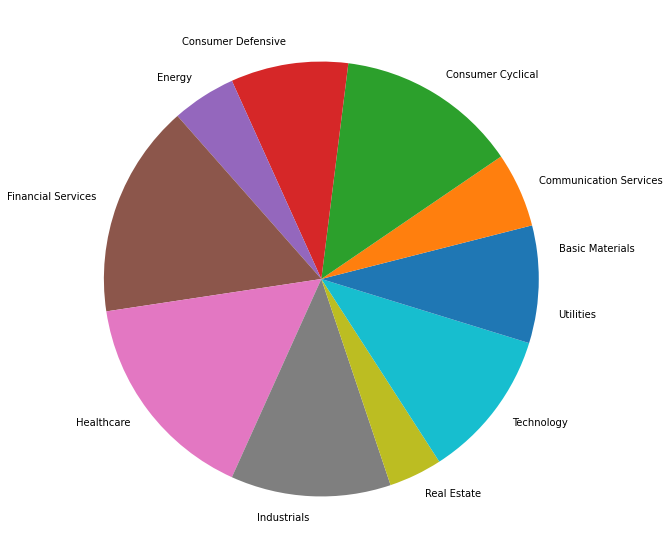

In [48]:
%matplotlib inline

fig = plt.figure(figsize=(10,10))
plt.pie(sector_df['count'], labels=sector_df['sector'])
plt.show()

This pie chart indicates that we have a good distribution of sectors for our companies of interest.

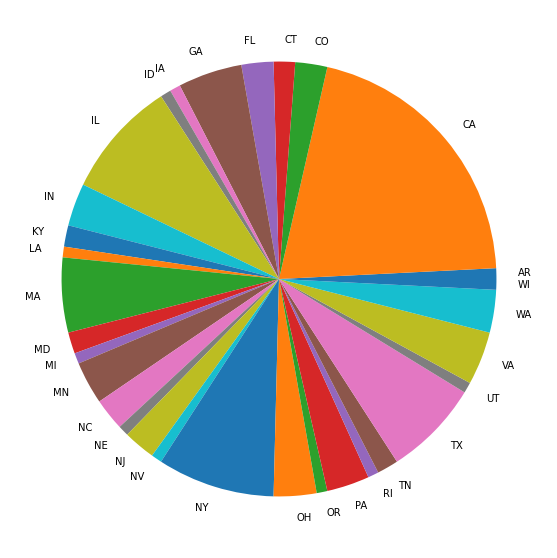

In [49]:
%matplotlib inline

fig = plt.figure(figsize=(10,10))
plt.pie(state_df['count'], labels=state_df['state'])
plt.show()

This pie chart indicates that we have a good variety of states for our companies of interest. However, there is a concentration in California, as might be expected. (Not for long)

We next want to assess if we have a good distribution of stocks with quarter 1 price increases versus decreases. We won't include the directions in 2021 as this will not be used in our training set.

In [50]:
direction_df = market_data[['ticker', 'year', 'direction']]
direction_df = direction_df[direction_df.year <= 2020]
direction_series = direction_df.groupby(by=['direction'])['ticker'].count()
direction_df = direction_series.to_frame().reset_index().rename(columns={'ticker':'count'})
direction_df['direction'] = direction_df['direction'].astype(str)
direction_df

,direction,count
0,-1,345
1,1,537


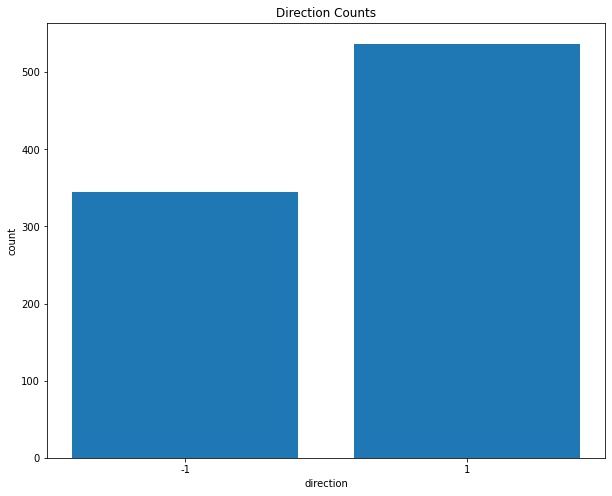

In [51]:
%matplotlib inline

fig, ax = plt.subplots(figsize=(10, 8))
plt.title('Direction Counts')
direction_plot = plt.bar(direction_df['direction'], direction_df['count'])
ax.set(ylabel='count', xlabel='direction')

plt.show()

We can see from the above plot that we have a good distribution of positively moving stocks versus negatively moving stocks.

We next want to see the relevance of our sentiment data to share price. We will make some graphical illustrations of this, taking Apple as an example:

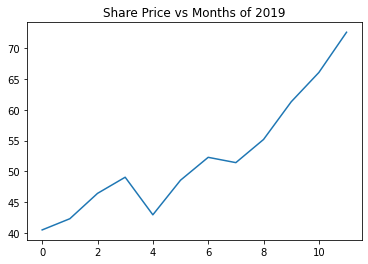

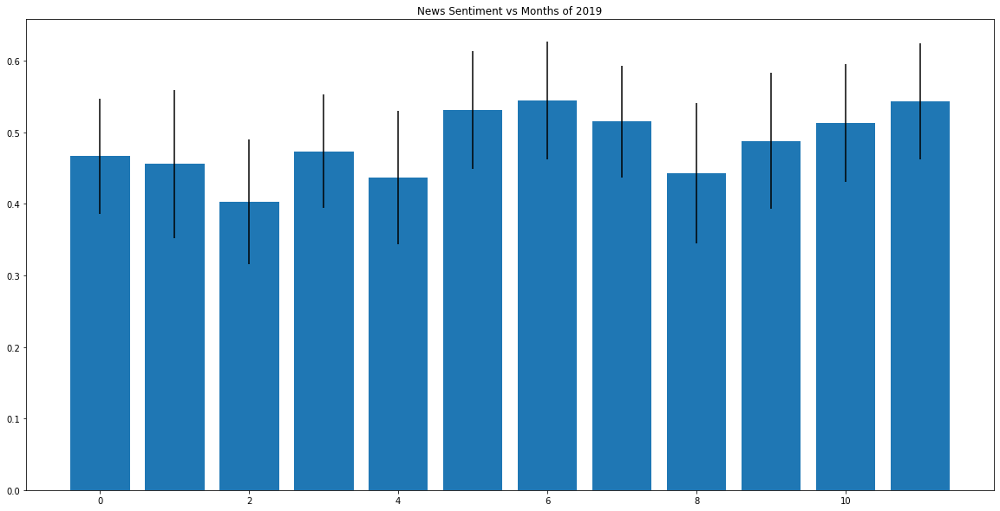

In [52]:
%matplotlib inline

appl_df = market_data[market_data['ticker'] == 'AAPL']
appl_df = appl_df[appl_df['year'] == 2019]

sentiment_list = appl_df[['jan_sentiment', 'feb_sentiment', 'mar_sentiment', 'apr_sentiment', 'may_sentiment', 'jun_sentiment', 'jul_sentiment', 'aug_sentiment', 'sep_sentiment','oct_sentiment', 'nov_sentiment', 'dec_sentiment']].iloc[0]
confidence_list = appl_df[['jan_confidence', 'feb_confidence', 'mar_confidence', 'apr_confidence', 'may_confidence', 'jun_confidence', 'jul_confidence', 'aug_confidence', 'sep_confidence', 'oct_confidence', 'nov_confidence', 'dec_confidence']].iloc[0] - 1
month_title_list = ['jan_sentiment', 'feb_sentiment', 'mar_sentiment', 'apr_sentiment', 'may_sentiment', 'jun_sentiment', 'jul_sentiment', 'aug_sentiment', 'sep_sentiment','oct_sentiment', 'nov_sentiment', 'dec_sentiment']
month_title_list = [i for i, _ in enumerate(month_title_list)]

appl_price_df = market_data[market_data['ticker'] == 'AAPL']
appl_price_df = appl_price_df[appl_price_df['year'] == 2019]
price_list = appl_price_df[['jan_close', 'feb_close', 'mar_close', 'apr_close', 'may_close', 'jun_close', 'jul_close', 'aug_close', 'sep_close', 'oct_close', 'nov_close', 'dec_close']].iloc[0]

plt.title("Share Price vs Months of 2019")
plot1 = plt.figure(1, figsize=(10, 5))
price_plot = plt.plot(month_title_list, price_list)

plot2 = plt.figure(2, figsize=(20, 10))
plt.title("News Sentiment vs Months of 2019")
sentiment_plot = plt.bar(month_title_list, sentiment_list, yerr= confidence_list)

plt.show()

Next, we'll consider the relatedness of the percentage change of Apple's share price in a given year compared to its sentiment over a given year in monthly intervals:

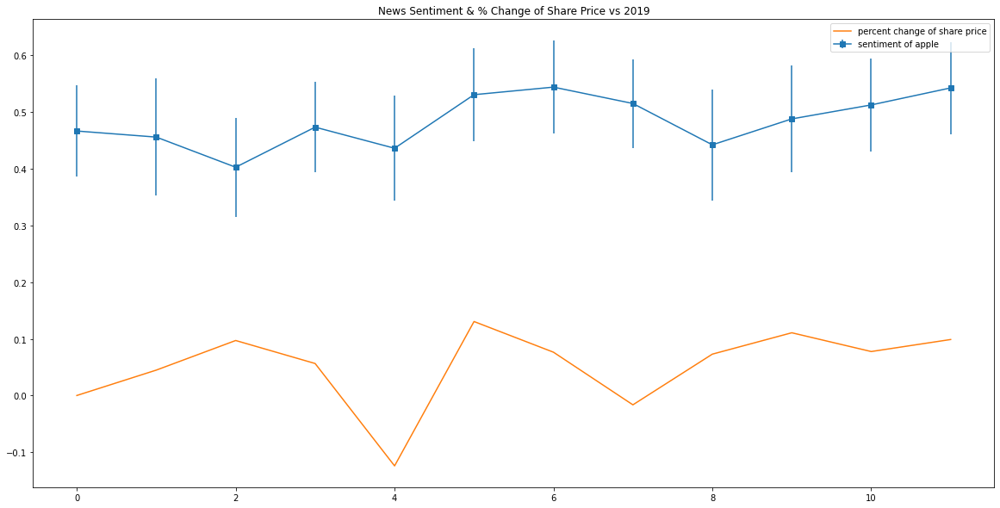

In [53]:
%matplotlib inline

percent_change = [0]
i = 1
while i < 12:
  percent_change.append((price_list[i] - price_list[i - 1]) / price_list[i - 1])
  i = i + 1

plt.figure(figsize=(20,10))
plt.errorbar(month_title_list, sentiment_list, yerr = confidence_list, marker = 's')
plt.plot(month_title_list, percent_change)
plt.title("News Sentiment & % Change of Share Price vs 2019")
plt.legend(["percent change of share price", "sentiment of apple"])

plt.show()

We can see from the above plot that sentiment may be relatively useful to our models when predicting stock price movements.

# Section 3: Modeling

## Classification Models

In [54]:
market_data.columns

Index(['index', 'ticker', 'year', 'jan_close', 'feb_close', 'mar_close',
       'apr_close', 'may_close', 'jun_close', 'jul_close', 'aug_close',
       'sep_close', 'oct_close', 'nov_close', 'dec_close', 'percentage_change',
       'direction', 'eps', 'p/e', 'sector', 'state', 'market_cap/gdp',
       'volume', 'jan_confidence', 'feb_confidence', 'mar_confidence',
       'apr_confidence', 'may_confidence', 'jun_confidence', 'jul_confidence',
       'aug_confidence', 'sep_confidence', 'oct_confidence', 'nov_confidence',
       'dec_confidence', 'jan_sentiment', 'feb_sentiment', 'mar_sentiment',
       'apr_sentiment', 'may_sentiment', 'jun_sentiment', 'jul_sentiment',
       'aug_sentiment', 'sep_sentiment', 'oct_sentiment', 'nov_sentiment',
       'dec_sentiment', 'avg_sentiment', 'avg_confidence',
       'yearly_percent_change_sentiment', 'sentiment_score', 'eps_n-1',
       'p/e_n-1', 'market_cap/gdp_n-1', 'volume_n-1', 'sentiment_score_n-1',
       'yearly_percent_change_sentiment_n

In [55]:
features_df = market_data[['ticker', 'year', 'eps_n-1', 'p/e_n-1', 'market_cap/gdp_n-1', 'sentiment_score_n-1', 'start_price', 'cpi_n-1', 'unemployment_rate_n-1', 'sector', 'state']]
features_df = features_df[features_df['year'] != 2014]
features_df

,ticker,year,eps_n-1,p/e_n-1,market_cap/gdp_n-1,sentiment_score_n-1,start_price,cpi_n-1,unemployment_rate_n-1,sector,state
1,A,2015,3.05,12.474435,1.293413,0.502430,35.558342,236.736167,6.158333,Healthcare,CA
2,A,2016,1.73,21.671148,1.347630,0.500000,35.822720,237.017000,5.275000,Healthcare,CA
3,A,2017,1.98,20.980078,1.341082,0.598206,47.103657,240.007167,4.875000,Healthcare,CA
4,A,2018,2.37,24.483899,1.544038,0.586877,71.268051,245.119583,4.350000,Healthcare,CA
5,A,2019,2.79,23.483204,1.674424,0.611808,74.495102,251.106833,3.891667,Healthcare,CA
...,...,...,...,...,...,...,...,...,...,...,...
1043,ZION,2017,1.82,14.303525,1.341082,0.500000,37.437042,240.007167,4.875000,Financial Services,UT
1044,ZION,2018,2.66,14.975879,1.544038,0.524184,48.424587,245.119583,4.350000,Financial Services,UT
1045,ZION,2019,3.82,12.148002,1.674424,0.374456,43.502079,251.106833,3.891667,Financial Services,UT
1046,ZION,2020,4.28,10.172491,1.721350,0.503906,42.742573,255.657417,3.683333,Financial Services,UT


In [56]:
features_df = pd.get_dummies(features_df)
features_df = pd.get_dummies(features_df, columns=['year'])
features_df

,eps_n-1,p/e_n-1,market_cap/gdp_n-1,sentiment_score_n-1,start_price,cpi_n-1,unemployment_rate_n-1,ticker_A,ticker_AAPL,ticker_ABC,ticker_ABT,ticker_ADI,ticker_ADM,ticker_ADSK,ticker_AFL,ticker_AIG,ticker_AIZ,ticker_AKAM,ticker_ALL,ticker_AMAT,ticker_AMGN,ticker_AMP,ticker_AMT,ticker_AMZN,ticker_ANTM,ticker_APA,ticker_APD,ticker_ATVI,ticker_AVB,ticker_AVGO,ticker_AXP,ticker_AZO,ticker_BA,ticker_BAX,ticker_BBY,ticker_BDX,ticker_BIIB,ticker_BK,ticker_CHTR,ticker_CI,...,sector_Technology,sector_Utilities,state_AR,state_CA,state_CO,state_CT,state_FL,state_GA,state_IA,state_ID,state_IL,state_IN,state_KY,state_LA,state_MA,state_MD,state_MI,state_MN,state_NC,state_NE,state_NJ,state_NV,state_NY,state_OH,state_OR,state_PA,state_RI,state_TN,state_TX,state_UT,state_VA,state_WA,state_WI,year_2015,year_2016,year_2017,year_2018,year_2019,year_2020,year_2021
1,3.05,12.474435,1.293413,0.502430,35.558342,236.736167,6.158333,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,1.73,21.671148,1.347630,0.500000,35.822720,237.017000,5.275000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,1.98,20.980078,1.341082,0.598206,47.103657,240.007167,4.875000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
4,2.37,24.483899,1.544038,0.586877,71.268051,245.119583,4.350000,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
5,2.79,23.483204,1.674424,0.611808,74.495102,251.106833,3.891667,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,1.82,14.303525,1.341082,0.500000,37.437042,240.007167,4.875000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
1044,2.66,14.975879,1.544038,0.524184,48.424587,245.119583,4.350000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
1045,3.82,12.148002,1.674424,0.374456,43.502079,251.106833,3.891667,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
1046,4.28,10.172491,1.721350,0.503906,42.742573,255.657417,3.683333,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0


In [57]:
labels_df = market_data[market_data['year'] != 2014][['end_price', 'direction']]
labels_df = pd.get_dummies(labels_df, columns=['direction'], drop_first=True)
labels_df

,end_price,direction_1
1,39.043472,1
2,39.046680,1
3,53.083344,1
4,63.946896,0
5,77.052231,1
...,...,...
1043,35.584961,0
1044,49.259499,1
1045,45.365391,1
1046,29.920683,0


In [58]:
labels_binary = np.array(labels_df['direction_1'])

In [59]:
features_binary_df = features_df
features_binary_df = features_binary_df.drop('start_price', axis=1)
features = np.array(features_binary_df)
feature_list = list(features_binary_df.columns)

Let's assess how correlated our features are:

In [60]:
corr_matrix = features_binary_df.corr()
corr_matrix.style.background_gradient()

Splitting into training and test sets:

In [61]:
from sklearn.model_selection import train_test_split
import sklearn.metrics

X_train, X_test, y_train, y_test = train_test_split(features, labels_binary, train_size=0.75, random_state=42)

In [70]:
from sklearn import tree

clf = tree.DecisionTreeClassifier(criterion='entropy', random_state=42)
clf = clf.fit(X_train, y_train)

prediction = clf.predict(X_test)

accuracy = sklearn.metrics.accuracy_score(prediction, y_test)
print("Accuracy: %.1f%%"% (accuracy*100))

Accuracy: 67.4%


In [63]:
%matplotlib inline

plt.figure(dpi=400)
tree.plot_tree(clf)
plt.show()

We will now implement a Random Forest Classification model:

Accuracy: 73.3%
[[ 42  45]
 [ 14 120]]


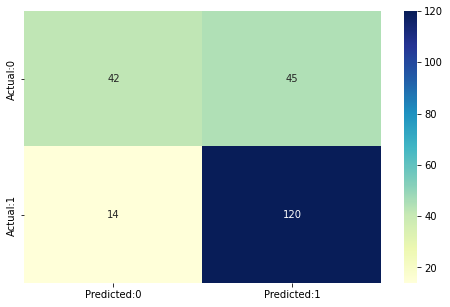

In [71]:
%matplotlib inline

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix

clf = RandomForestClassifier(n_estimators = 100, random_state=42)
clf.fit(X_train,y_train)
prediction = clf.predict(X_test)

accuracy = sklearn.metrics.accuracy_score(prediction,y_test)
print("Accuracy: %.1f%%"% (accuracy*100))

confmat = confusion_matrix(y_true=y_test, y_pred=prediction)

print(confmat)
conf_matrix = pd.DataFrame(data=confmat,
                           columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

plt.show()

We will now implement a Logistic Regression Classification model:

In [83]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import multilabel_confusion_matrix

clf = LogisticRegression(penalty='l2', random_state=42,\
                                             max_iter=5000)
clf.fit(X_train, y_train)

prediction = clf.predict(X_test)

accuracy = sklearn.metrics.accuracy_score(prediction,y_test)
print("Accuracy: %.1f%%"% (accuracy*100))

confmat = multilabel_confusion_matrix(y_true=y_test, y_pred=prediction,\
                           labels=[1])

print(confmat)

Accuracy: 69.2%
[[[ 41  46]
  [ 22 112]]]


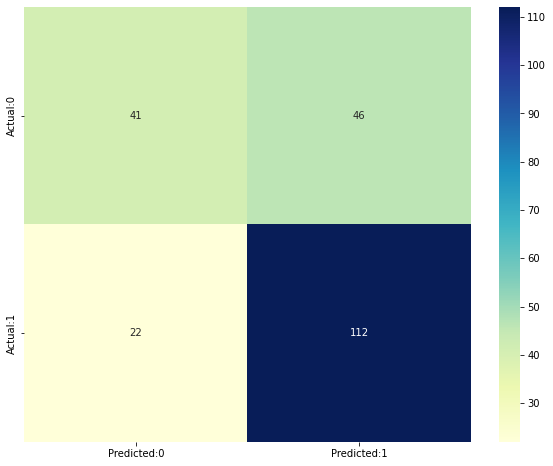

In [84]:
%matplotlib inline

conf_matrix = pd.DataFrame(data=confmat[0],
                           columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (10,8))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")
plt.show()

## Random Forest Continuous Model

In [85]:
features = np.array(features_df)
feature_list = list(features_df.columns)

Let's assess how correlated our features are:

In [86]:
corr_matrix = features_df.corr()
corr_matrix.style.background_gradient()

In [87]:
labels = np.array(labels_df['end_price'])

In [88]:
X_train, X_test, y_train, y_test = train_test_split(features, labels, train_size=0.75, random_state=42)

In [89]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
prediction = rf.predict(X_test)

accuracy = rf.score(X_test, y_test)
print("R2 Score: %.1f%%"% (accuracy*100))
print("Mean Absolute Error:", sklearn.metrics.mean_absolute_error(y_test, prediction))
print("Mean Squared Error:", sklearn.metrics.mean_squared_error(y_test, prediction))
print("Root Mean Squared Error:", np.sqrt(sklearn.metrics.mean_squared_error(y_test, prediction)))

R2 Score: 88.6%
Mean Absolute Error: 20.74505527017343
Mean Squared Error: 9183.999277904522
Root Mean Squared Error: 95.83318463822708


Let's plot how our model performed:

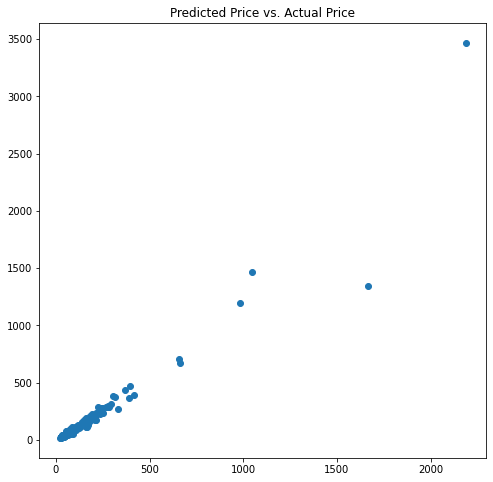

In [90]:
from IPython.core.pylabtools import figsize
%matplotlib inline

pred_act_df = pd.DataFrame({'Prediction': list(prediction), 'Actual': list(y_test)})

fig, ax = plt.subplots(figsize=(8,8))
ax.scatter(pred_act_df['Prediction'], pred_act_df['Actual'])
ax.set(title='Predicted Price vs. Actual Price')
plt.show()

Determining Feature Importance:

In [ ]:
%matplotlib inline

importances = pd.Series(rf.feature_importances_, index=feature_list)
importance_list = list(zip(importances.index, importances))
importance_list = sorted(importance_list, key=lambda x: x[1], reverse = True)
[print('Feature: {:30} Importance: {}'.format(*tup)) for tup in importance_list];

importance_list_top_15 = importance_list[0:15]
fig, ax = plt.subplots(figsize = (50, 20))
ax.set(title='Feature Importance', ylabel='importance', xlabel='feature')
plt.bar(*zip(*importance_list_top_15))

plt.show()

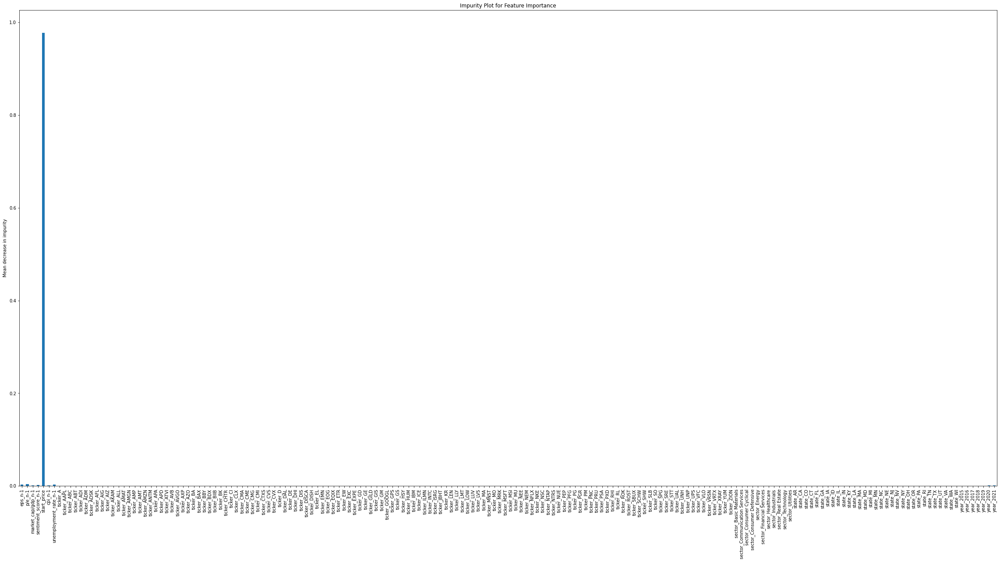

In [92]:
%matplotlib inline
# impurity plot
std = np.std([rf.feature_importances_ for tree in rf.estimators_], axis=0)

fig, ax = plt.subplots(figsize=(40, 20))
importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Impurity Plot for Feature Importance")
ax.set_ylabel("Mean decrease in impurity")
plt.show()

Let's take our top 10 most important variables and see if we can improve our model:

In [93]:
features = np.array(features_df[['start_price', 'p/e_n-1', 'unemployment_rate_n-1', 'eps_n-1', 'sentiment_score_n-1', 'market_cap/gdp_n-1', 'cpi_n-1', 'year_2020', 'year_2021', 'sector_Consumer Cyclical']])
X_train, X_test, y_train, y_test = train_test_split(features, labels, train_size=0.75, random_state=42)

In [94]:
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
prediction = rf.predict(X_test)

accuracy = rf.score(X_test, y_test)
print("R2 Score: %.1f%%"% (accuracy*100))
print("Mean Absolute Error:", sklearn.metrics.mean_absolute_error(y_test, prediction))
print("Mean Squared Error:", sklearn.metrics.mean_squared_error(y_test, prediction))
print("Root Mean Squared Error:", np.sqrt(sklearn.metrics.mean_squared_error(y_test, prediction)))

R2 Score: 87.6%
Mean Absolute Error: 21.360751994076892
Mean Squared Error: 9926.168784207972
Root Mean Squared Error: 99.63016001295979


Let's again plot how our model performed:

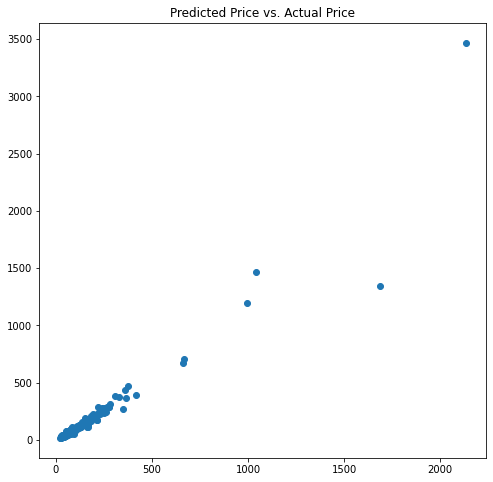

In [95]:
%matplotlib inline

pred_act_df = pd.DataFrame({'Prediction': list(prediction), 'Actual': list(y_test)})

fig, ax = plt.subplots(figsize=(8,8))
ax.scatter(pred_act_df['Prediction'], pred_act_df['Actual'])
ax.set(title='Predicted Price vs. Actual Price')
plt.show()

We can see from the various scoring metrics that our two models performed very similarly well. The scatter plots, likewise, illustrate similar predictions for both feature sets. It is also clear that start price is by far the most important feature

## Linear Regression Models

In [175]:
# Load in our stocks data csv
stocks_data = pd.read_csv('sp_clean_full.csv', index_col=[0])

stocks_data

,ticker,year,jan_close,feb_close,mar_close,apr_close,may_close,jun_close,jul_close,aug_close,sep_close,oct_close,nov_close,dec_close,percentage_change,direction,eps,p/e,sector,country,state,market_cap/gdp,volume,jan_confidence,feb_confidence,mar_confidence,apr_confidence,may_confidence,jun_confidence,jul_confidence,aug_confidence,sep_confidence,oct_confidence,nov_confidence,dec_confidence,jan_sentiment,feb_sentiment,mar_sentiment,apr_sentiment,may_sentiment,jun_sentiment,jul_sentiment,aug_sentiment,sep_sentiment,oct_sentiment,nov_sentiment,dec_sentiment,avg_sentiment,avg_confidence,yearly_percent_change_sentiment,sentiment_score,eps_n-1,p/e_n-1,market_cap/gdp_n-1,volume_n-1,sentiment_score_n-1,yearly_percent_change_sentiment_n-1,start_price,end_price,price_change,cpi,unemployment_rate,cpi_n-1,unemployment_rate_n-1
0,A,2014,38.778275,37.964687,37.291145,36.124706,38.063301,38.485432,37.580914,38.297825,38.266037,37.124374,40.139034,38.448578,-6.842925,-1,3.05,12.474435,Healthcare,United States,CA,1.293413,150011,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.699949,0.000000,0.000000,0.000000,0.000000,0.500000,0.500000,0.50,0.500000,0.500000,0.500000,0.500000,1.000000,0.500000,0.500000,0.5,0.5,0.541667,0.058329,0.0,0.502430,NaN,NaN,NaN,NaN,NaN,NaN,38.778275,36.124706,-2.653568,236.736167,6.158333,NaN,NaN
1,AAPL,2014,15.900002,16.814430,17.149929,18.854563,20.338593,20.901197,21.501711,23.168289,22.772730,24.411461,26.998556,25.057606,18.582144,1,6.43,3.290164,Technology,United States,CA,1.293413,44991907,0.899155,0.918822,0.887372,0.933725,0.894993,0.915273,0.914117,0.894055,0.904289,0.916787,0.908203,0.926156,0.452381,0.294118,0.36,0.339286,0.421053,0.391304,0.362319,0.297297,0.366071,0.401961,0.5,0.4,0.382149,0.909412,0.0,0.392825,NaN,NaN,NaN,NaN,NaN,NaN,15.900002,18.854563,2.954561,236.736167,6.158333,NaN,NaN
2,ABC,2014,59.105267,59.866894,57.872810,57.511047,64.796059,64.335602,68.098732,68.735878,68.655945,75.859016,81.133575,80.340523,-2.697254,-1,3.97,16.925091,Healthcare,United States,PA,1.293413,34492,0.000000,0.000000,0.000000,0.000000,0.999179,0.841697,0.000000,0.000000,0.000000,0.985626,0.000000,0.000000,0.500000,0.500000,0.50,0.500000,0.000000,1.000000,0.500000,0.500000,0.500000,1.000000,0.5,0.5,0.541667,0.235542,0.0,0.509814,NaN,NaN,NaN,NaN,NaN,NaN,59.105267,57.511047,-1.594219,236.736167,6.158333,NaN,NaN
3,ABT,2014,31.523703,34.206570,33.114502,33.510143,34.608688,35.378540,36.629250,36.733597,36.168343,38.109020,38.913326,39.359200,6.301419,1,2.15,16.599026,Healthcare,United States,IL,1.293413,307236,0.000000,0.000000,0.000000,0.964863,0.000000,0.000000,0.939127,0.941798,0.000000,0.988251,0.000000,0.962146,0.500000,0.500000,0.50,1.000000,0.500000,0.500000,0.750000,0.500000,0.500000,1.000000,0.5,0.0,0.562500,0.399682,0.0,0.524980,NaN,NaN,NaN,NaN,NaN,NaN,31.523703,33.510143,1.986441,236.736167,6.158333,NaN,NaN
4,ACN,2014,68.320152,71.287994,68.183319,69.435783,70.500420,69.972435,68.622154,70.162834,70.387901,71.167824,75.738602,78.353012,1.632946,1,4.66,15.238420,Technology,Ireland,NaN,1.293413,156447,0.000000,0.000000,0.000000,0.000000,0.000000,0.921568,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.500000,0.50,0.500000,0.500000,1.000000,0.500000,0.500000,0.500000,0.500000,0.5,0.5,0.541667,0.076797,0.0,0.503200,NaN,NaN,NaN,NaN,NaN,NaN,68.320152,69.435783,1.115631,236.736167,6.158333,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,VRSN,2021,194.070007,194.029999,198.759995,218.770004,219.919998,227.690002,216.369995,216.259995,205.009995,222.669998,244.460007,NaN,12.727364,1,5.42,39.550654,Technology,United States,VA,2.445980,9745,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.98,29.279608,1.

In [176]:
# Filtering out all entries from the year 2014 
# The first year we want to look at is 2014 to 2015 so we have n-1 variables
stocks_data = stocks_data[stocks_data.year != 2014]
stocks_data = stocks_data[stocks_data.country == 'United States']
stocks_data

,ticker,year,jan_close,feb_close,mar_close,apr_close,may_close,jun_close,jul_close,aug_close,sep_close,oct_close,nov_close,dec_close,percentage_change,direction,eps,p/e,sector,country,state,market_cap/gdp,volume,jan_confidence,feb_confidence,mar_confidence,apr_confidence,may_confidence,jun_confidence,jul_confidence,aug_confidence,sep_confidence,oct_confidence,nov_confidence,dec_confidence,jan_sentiment,feb_sentiment,mar_sentiment,apr_sentiment,may_sentiment,jun_sentiment,jul_sentiment,aug_sentiment,sep_sentiment,oct_sentiment,nov_sentiment,dec_sentiment,avg_sentiment,avg_confidence,yearly_percent_change_sentiment,sentiment_score,eps_n-1,p/e_n-1,market_cap/gdp_n-1,volume_n-1,sentiment_score_n-1,yearly_percent_change_sentiment_n-1,start_price,end_price,price_change,cpi,unemployment_rate,cpi_n-1,unemployment_rate_n-1
131,A,2015,35.558342,39.738354,39.213345,39.043472,38.873589,36.501514,38.743832,34.353806,32.574764,35.829395,39.681820,39.780800,9.801161,1,1.73,21.671148,Healthcare,United States,CA,1.34763,100256,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.885530,0.980883,0.500000,0.500000,0.500000,0.500000,0.5000,0.50,0.500000,0.500000,0.500000,0.500000,0.000000,1.000000,0.500000,0.155534,-0.076923,0.500000,3.05,12.474435,1.293413,150011.0,0.502430,0.000000,35.558342,39.043472,3.485130,237.0170,5.275,236.736167,6.158333
132,AAPL,2015,26.596750,29.277081,28.358606,28.522703,29.815893,28.705923,27.760731,25.923075,25.357531,27.472578,27.313120,24.302439,7.241309,1,9.20,2.983754,Technology,United States,CA,1.34763,48589665,0.907565,0.895090,0.919123,0.904844,0.897647,0.917602,0.912750,0.906047,0.915011,0.913374,0.909202,0.910227,0.425926,0.384615,0.412429,0.403846,0.4375,0.42,0.411348,0.368794,0.340741,0.338235,0.215054,0.384615,0.378592,0.909040,-0.009308,0.389635,6.43,3.290164,1.293413,44991907.0,0.392825,0.000000,26.596750,28.522703,1.925953,237.0170,5.275,236.736167,6.158333
133,ABC,2015,84.697937,91.837967,101.588356,102.151405,100.852219,95.279198,94.750549,89.884201,85.346863,86.712570,88.934105,93.505241,20.606722,1,4.96,18.742282,Healthcare,United States,PA,1.34763,44679,0.000000,0.000000,0.928633,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.500000,0.500000,0.000000,0.500000,0.5000,0.50,0.500000,0.500000,0.500000,0.500000,0.500000,0.500000,0.458333,0.077386,-0.153846,0.496776,3.97,16.925091,1.293413,34492.0,0.509814,0.000000,84.697937,102.151405,17.453468,237.0170,5.275,236.736167,6.158333
134,ABT,2015,39.339027,41.632935,40.718895,41.006710,42.932499,43.356510,44.995056,40.201736,35.701340,39.997707,40.104828,40.095913,4.239257,1,2.24,18.232260,Healthcare,United States,IL,1.34763,254570,0.916806,0.000000,0.000000,0.000000,0.000000,0.000000,0.924120,0.993565,0.000000,0.000000,0.000000,0.000000,0.500000,0.500000,0.500000,0.500000,0.5000,0.50,1.000000,0.000000,0.500000,0.500000,0.500000,0.500000,0.500000,0.236208,-0.111111,0.500000,2.15,16.599026,1.293413,307236.0,0.524980,0.000000,39.339027,41.006710,1.667683,237.0170,5.275,236.736167,6.158333
136,ADI,2015,44.668407,50.519157,54.368084,53.367020,59.001534,55.728493,50.640949,48.882900,49.364197,52.610802,53.932205,48.726902,19.473746,1,3.16,16.397960,Technology,United States,MA,1.34763,124025,0.000000,0.796027,0.000000,0.000000,0.999742,0.000000,0.611595,0.892998,0.000000,0.969153,0.000000,0.000000,0.500000,0.000000,0.500000,0.500000,0.0000,0.50,0.000000,1.000000,0.500000,1.000000,0.500000,0.500000,0.458333,0.355793,-0.153846,0.485175,2.40,18.199919,1.293413,53682.0,0.503463,0.000000,44.668407,53.367020,8.698612,237.0170,5.275,236.736167,6.158333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,VRSN,2021,194.070007,194.029999,198.759995,218.770004,219.919998,227.690002,216.3699

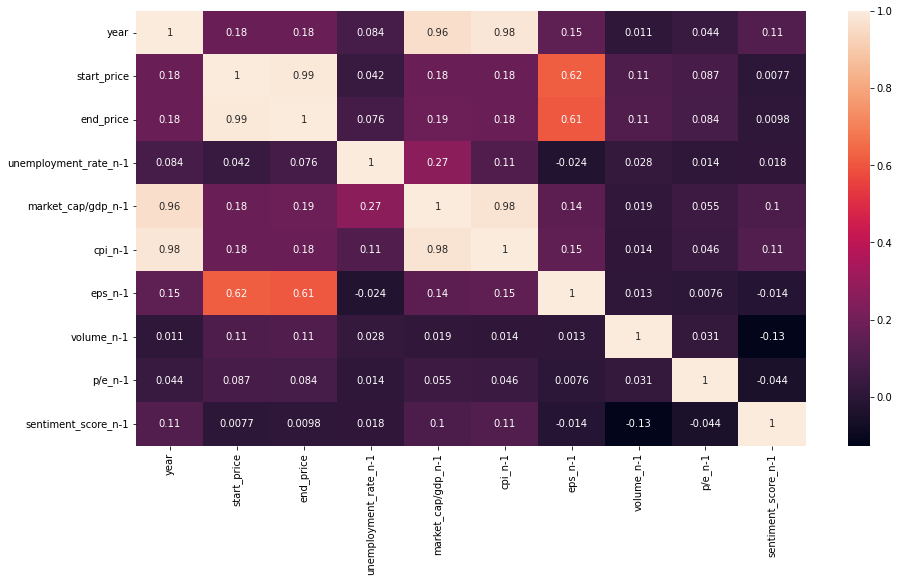

In [177]:
# Look for multicolinearity
# Is the data correlated that I want to run the model on?
stocks_data = stocks_data[['ticker','year','start_price', 'end_price', 'sector', 'state', 'unemployment_rate_n-1', 'market_cap/gdp_n-1', 'cpi_n-1', 'eps_n-1', 'volume_n-1', 'p/e_n-1', 'sentiment_score_n-1']]
corr_matrix = stocks_data.corr()

import seaborn as sn
import matplotlib.pyplot as plt

plt.figure(figsize=(15,8))
sn.heatmap(corr_matrix, annot=True)
plt.show()

No significant multicolinearity we will keep all the features for now

In [ ]:
# One hot encode categorical types Ticker, Year, Sector, State
stocks_data = pd.get_dummies(data = stocks_data, columns = ['ticker','year','sector','state'])
stocks_data

In [ ]:
# Check that the df is formatted correctly
stocks_data

In [ ]:
# Perform PCA

# End price corresponds to the price at the end of the first quarter in the following year
y = stocks_data['end_price']
# DataFrame without value we are trying to predict
X = stocks_data.drop(columns=['end_price'])

X

In [181]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardizing the features based on unit variance
X2 = StandardScaler().fit_transform(X)

# Testing for the ideal n_components
pca = PCA(n_components= 12) # Number of components
X = pca.fit_transform(X2)

In [182]:
from sklearn.model_selection import train_test_split
# Split the test and train data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25) 

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, mean_absolute_error, mean_squared_error, r2_score
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

clf1 = LinearRegression()
clf1.fit(X_train, y_train)

predictions = clf1.predict(X_test)

print("Score:", clf1.score(X_test, y_test))
plt.figure(dpi=100)
plt.scatter(y_test, predictions)

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

Let us see how the features are weighted by the model before and after normalization

136.33869006292747
[ 75.69204144  36.18025638  14.76515566 -13.14750663 -14.41869462
  18.65275619 -27.4396651  -16.44058008  26.4824677   21.49051455
  18.83651224   8.5823476 ]


<BarContainer object of 12 artists>

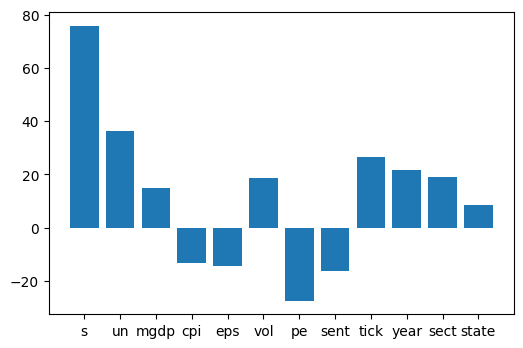

In [185]:
# Weight of the features before any normilization

print(clf1.intercept_)
print(clf1.coef_)
plt.figure(dpi=100)
plt.bar(['s','un','mgdp','cpi','eps','vol','pe','sent','tick','year','sect','state'], clf1.coef_)

Lasso Model

Score: 0.6466977670824714
MAE: 70.78674114109263
MSE: 12582.54372084855
RMSE: 112.1719382058122
R^2 Score: 64.66977670824714
[ 75.4786094   35.91795025  14.49434069 -12.86721584 -14.07339523
  18.32790523 -27.0549     -16.0774211   26.12092237  21.1842894
  18.43048617   8.1825169 ]


<BarContainer object of 12 artists>

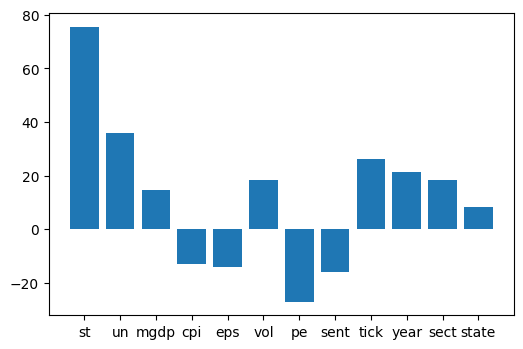

In [186]:
# Weight of the features with a lasso model

from sklearn.linear_model import Lasso

clf2 = Lasso()
clf2.fit(X_train, y_train)

predictions = clf2.predict(X_test)

print("Score:", clf2.score(X_test, y_test))

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

print(clf2.coef_)
plt.figure(dpi=100)
plt.bar(['st','un','mgdp','cpi','eps','vol','pe','sent','tick','year','sect','state'], clf2.coef_)

Ridge Model

Score: 0.6478040769406876
MAE: 70.9296491759451
MSE: 12543.143482574198
RMSE: 111.99617619621752
R^2 Score: 64.78040769406877
[ 75.66149164  36.165049    14.76060662 -13.14404863 -14.41197412
  18.64370447 -27.42420305 -16.43278317  26.46684872  21.48131265
  18.82448336   8.57867179]


<BarContainer object of 12 artists>

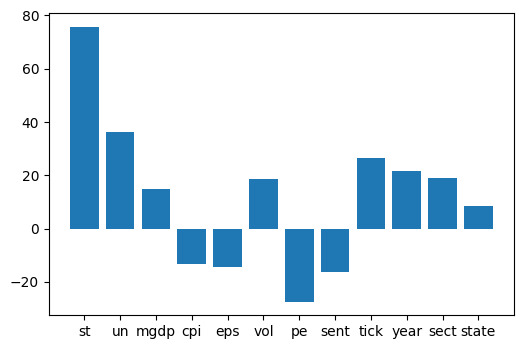

In [187]:
# Weight of features with a ridge model

from sklearn.linear_model import Ridge

clf3 = Ridge()
clf3.fit(X_train, y_train)

predictions = clf3.predict(X_test)

print("Score:", clf3.score(X_test, y_test))

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

print(clf3.coef_)
plt.figure(dpi=100)
plt.bar(['st','un','mgdp','cpi','eps','vol','pe','sent','tick','year','sect','state'], clf3.coef_)

ElasticNet Model

Score: 0.6298882197022766
MAE: 65.17085498502853
MSE: 13181.200749116886
RMSE: 114.8094105425025
R^2 Score: 62.98882197022766
[ 66.68571093  31.65080968  13.25703303 -11.93291823 -12.35523273
  15.94568784 -22.97110414 -14.06485386  22.012614    18.69069306
  15.38664487   7.33741198]


<BarContainer object of 12 artists>

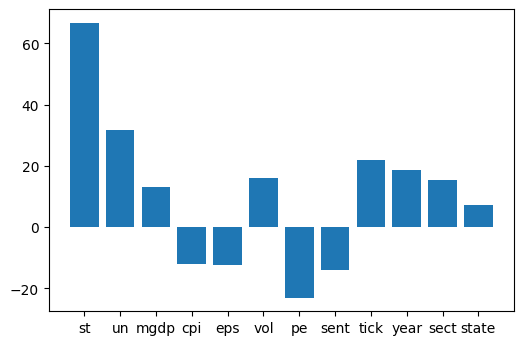

In [189]:
from sklearn.linear_model import ElasticNet


clf4 = ElasticNet()
clf4.fit(X_train, y_train)

predictions = clf4.predict(X_test)

print("Score:", clf4.score(X_test, y_test))

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

print(clf4.coef_)
plt.figure(dpi=100)
plt.bar(['st','un','mgdp','cpi','eps','vol','pe','sent','tick','year','sect','state'], clf4.coef_)

What if we do not use standardscalar so our data which is real world stock prices and various factors. So we would not have a mean of zero and variance of 1?

Lasso again

In [190]:
# Perform PCA

# End price corresponds to the price at the end of the first quarter in the following year
y = stocks_data['end_price']
# DataFrame without value we are trying to predict
X = stocks_data.drop(columns=['end_price'])

X

from sklearn.decomposition import PCA

pca2 = PCA(n_components= 12) # Number of components in the final data set
X = pca2.fit_transform(X)

In [191]:
from sklearn.model_selection import train_test_split
# Split the test and train data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25) 

Score: 0.9879703855397891
MAE: 15.907473813638005
MSE: 960.115879791184
RMSE: 30.985736715320876
R^2 Score: 98.79703855397891
[ 7.39922851e-06  1.08829279e+00  8.27154027e-02  1.08901340e-01
 -3.24715801e-01  4.83369288e+00 -0.00000000e+00 -0.00000000e+00
  0.00000000e+00 -1.28478684e+00  0.00000000e+00 -5.40837936e+00]


<BarContainer object of 12 artists>

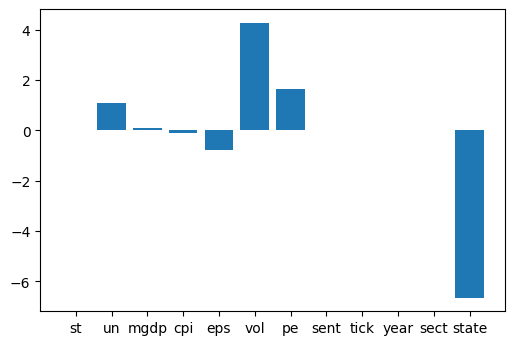

In [192]:
# Weight of the features with a lasso model

from sklearn.linear_model import Lasso

clf5 = Lasso()
clf5.fit(X_train, y_train)

predictions = clf5.predict(X_test)

print("Score:", clf5.score(X_test, y_test))

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

print(clf.coef_)
plt.figure(dpi=100)
plt.bar(['st','un','mgdp','cpi','eps','vol','pe','sent','tick','year','sect','state'], clf5.coef_)

### Takeaways 1
- In subsequent analysis, we will take out the most weighted factor in the model without using standard_scalar, which is yearly options volume. This model is the most succesful and we should investigate it
- The most succcesful lasso model weighs options volume the most
- When standard_scalar is used the models perform poorly and all weigh the factors roughly equally

In [198]:
# Perform PCA

# End price corresponds to the price at the end of the first quarter in the following year
y = stocks_data['end_price']
# DataFrame without value we are trying to predict and no volume
X = stocks_data.drop(columns=['end_price','volume_n-1'])

X

,start_price,unemployment_rate_n-1,market_cap/gdp_n-1,cpi_n-1,eps_n-1,p/e_n-1,sentiment_score_n-1,ticker_A,ticker_AAPL,ticker_ABC,ticker_ABT,ticker_ADI,ticker_ADM,ticker_ADSK,ticker_AFL,ticker_AIG,ticker_AIZ,ticker_AKAM,ticker_ALL,ticker_AMAT,ticker_AMGN,ticker_AMP,ticker_AMT,ticker_AMZN,ticker_ANTM,ticker_APA,ticker_APD,ticker_ATVI,ticker_AVB,ticker_AVGO,ticker_AXP,ticker_AZO,ticker_BA,ticker_BAX,ticker_BBY,ticker_BDX,ticker_BIIB,ticker_BK,ticker_CHTR,ticker_CI,...,sector_Consumer Cyclical,sector_Consumer Defensive,sector_Energy,sector_Financial Services,sector_Healthcare,sector_Industrials,sector_Real Estate,sector_Technology,sector_Utilities,state_AR,state_CA,state_CO,state_CT,state_FL,state_GA,state_IA,state_ID,state_IL,state_IN,state_KY,state_LA,state_MA,state_MD,state_MI,state_MN,state_NC,state_NE,state_NJ,state_NV,state_NY,state_OH,state_OR,state_PA,state_RI,state_TN,state_TX,state_UT,state_VA,state_WA,state_WI
131,35.558342,6.158333,1.293413,236.736167,3.05,12.474435,0.502430,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
132,26.596750,6.158333,1.293413,236.736167,6.43,3.290164,0.392825,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
133,84.697937,6.158333,1.293413,236.736167,3.97,16.925091,0.509814,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
134,39.339027,6.158333,1.293413,236.736167,2.15,16.599026,0.524980,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
136,44.668407,6.158333,1.293413,236.736167,2.40,18.199919,0.503463,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,194.070007,8.108333,1.973838,258.811167,6.98,29.279608,0.500000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1044,229.080002,8.108333,1.973838,258.811167,9.51,26.412460,0.503681,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1045,53.309685,8.108333,1.973838,258.811167,1.65,28.089460,0.502219,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1046,99.816818,8.108333,1.973838,258.811167,3.47,26.057586,0.506604,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [199]:
from sklearn.decomposition import PCA

pca = PCA(n_components= 11) # Number of components in the final data set
X2 = pca.fit_transform(X)

In [200]:
from sklearn.model_selection import train_test_split
# Split the test and train data
X_train, X_test, y_train, y_test = train_test_split(X2, y, test_size=0.25)

Linear Regression w/o Options Vol, Normalization, or Standard_Scaler

Score: 0.9759433820562657
MAE: 13.6483783397617
MSE: 936.053802458881
RMSE: 30.594996363112728
R^2 Score: 97.59433820562657


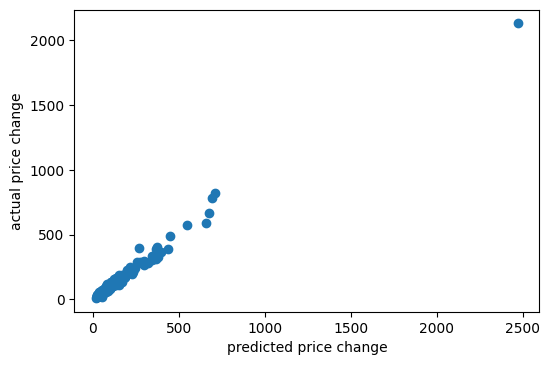

In [201]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, mean_absolute_error, mean_squared_error
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

clf = LinearRegression()
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)

print("Score:", clf.score(X_test, y_test))
plt.figure(dpi=100)
plt.xlabel('predicted price change')
plt.ylabel('actual price change')
plt.scatter(y_test, predictions)

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

137.40903454486786
[ 1.07047462e+00  8.16306443e-02  1.08619017e-01 -1.89610937e-03
  6.36724392e+00  6.20970441e-01 -7.37312249e+00  4.04911426e+00
 -2.65312557e+00 -1.36182363e+01 -3.78157545e+00]


<BarContainer object of 11 artists>

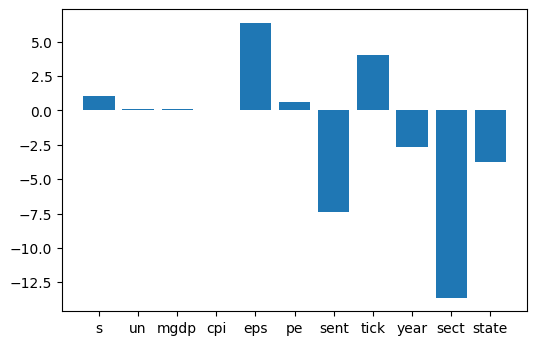

In [202]:
# Weight of the features before normilization

print(clf.intercept_)
print(clf.coef_)
plt.figure(dpi=100)
plt.bar(['s','un','mgdp','cpi','eps','pe','sent','tick','year','sect','state'], clf.coef_)

Lasso Model w/o Options Volume or Standard_Scaler

Score: 0.9769891649294326
MAE: 13.14591610772121
MSE: 895.36192144453
RMSE: 29.92259884175387
R^2 Score: 97.69891649294325
[ 1.07100953  0.08197009  0.09565941  0.          5.94186372  0.
 -0.98756631  0.         -0.         -6.69476735 -0.        ]


<BarContainer object of 11 artists>

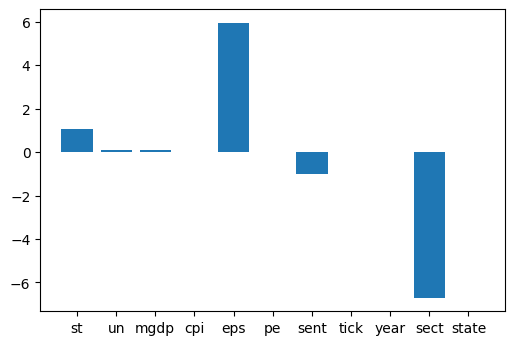

In [203]:
# Weight of the features with a lasso model

from sklearn.linear_model import Lasso

clf = Lasso()
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)

print("Score:", clf.score(X_test, y_test))

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

print(clf.coef_)
plt.figure(dpi=100)
plt.bar(['st','un','mgdp','cpi','eps','pe','sent','tick','year','sect','state'], clf.coef_)

 Ridge Model w/o Options Volume or Standard_Scaler

Score: 0.9759674107380315
MAE: 13.633250384737005
MSE: 935.118835665647
RMSE: 30.57971281202044
R^2 Score: 97.59674107380314
[ 1.07048233e+00  8.16370665e-02  1.08697758e-01 -1.80901685e-03
  6.36345596e+00  6.18688869e-01 -7.30086056e+00  4.01341279e+00
 -2.62876761e+00 -1.34774464e+01 -3.73817359e+00]


<BarContainer object of 11 artists>

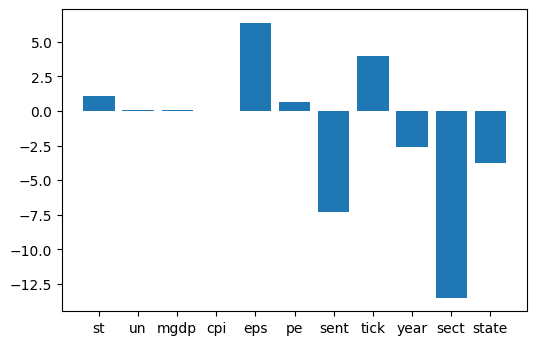

In [204]:
from sklearn.linear_model import Ridge

clf = Ridge()
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)

print("Score:", clf.score(X_test, y_test))

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

print(clf.coef_)
plt.figure(dpi=100)
plt.bar(['st','un','mgdp','cpi','eps','pe','sent','tick','year','sect','state'], clf.coef_)

Elastic Net w/o Options Volume or Standard_Scaler

Score: 0.977517190919798
MAE: 13.139616840336434
MSE: 874.8161931449487
RMSE: 29.57729184940617
R^2 Score: 97.75171909197981
[ 1.07127736  0.08223641  0.10869946 -0.          5.01288954  0.
 -0.9737229   0.26211484 -0.         -2.29894964 -0.        ]


<BarContainer object of 11 artists>

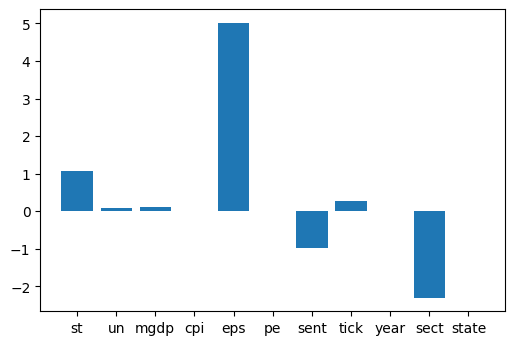

In [205]:
from sklearn.linear_model import ElasticNet


clf = ElasticNet()
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)

print("Score:", clf.score(X_test, y_test))

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

print(clf.coef_)
plt.figure(dpi=100)
plt.bar(['st','un','mgdp','cpi','eps','pe','sent','tick','year','sect','state'], clf.coef_)

### Takeaways 2
- Our models were accurately able to predict the ending price of a stock at the end of Q1 when given the starting price at the beginning of Q1. The model's did not weigh the starting price the most though, because it likely gave it an estimate of what the price should be like and then by taking into consideration the previous year EPS (most weighted factor in all models) an estimate was made. 
- The non normalized liner regression, lasso, ridge, and elastic net all performed very similarily. Aside from EPS, they did weigh paramters rather differently. 
- EPS, starting price, and ticker are what the models weighed the most, when calculating stock price. 
- The model completely ignored the sector of a stock except for in the ridge model which is interesting. 
- It is also interesting to note that our models perform better when we keep the data "raw" and don't scale the columns to variance of 1 and mean of 0. We are unsure why this is the case, but it is worth noting.

## Attempting to predict price change over Q1:

In [215]:
# Read in 
new_stocks_data = pd.read_csv('sp_clean_full.csv', index_col=[0])

# Filtering out all entries from the year 2014 
# The first year we want to look at is 2014 to 2015 so we have n-1 variables
new_stocks_data = new_stocks_data[new_stocks_data.year != 2014]
new_stocks_data = new_stocks_data[new_stocks_data.country == 'United States']
new_stocks_data

new_stocks_data = new_stocks_data[['ticker','year','start_price', 'end_price', 'sector', 'state', 'unemployment_rate_n-1', 'market_cap/gdp_n-1', 'cpi_n-1', 'eps_n-1', 'volume_n-1', 'p/e_n-1', 'sentiment_score_n-1', 'price_change']]
new_stocks_data

,ticker,year,start_price,end_price,sector,state,unemployment_rate_n-1,market_cap/gdp_n-1,cpi_n-1,eps_n-1,volume_n-1,p/e_n-1,sentiment_score_n-1,price_change
131,A,2015,35.558342,39.043472,Healthcare,CA,6.158333,1.293413,236.736167,3.05,150011.0,12.474435,0.502430,3.485130
132,AAPL,2015,26.596750,28.522703,Technology,CA,6.158333,1.293413,236.736167,6.43,44991907.0,3.290164,0.392825,1.925953
133,ABC,2015,84.697937,102.151405,Healthcare,PA,6.158333,1.293413,236.736167,3.97,34492.0,16.925091,0.509814,17.453468
134,ABT,2015,39.339027,41.006710,Healthcare,IL,6.158333,1.293413,236.736167,2.15,307236.0,16.599026,0.524980,1.667683
136,ADI,2015,44.668407,53.367020,Technology,MA,6.158333,1.293413,236.736167,2.40,53682.0,18.199919,0.503463,8.698612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,VRSN,2021,194.070007,218.770004,Technology,VA,8.108333,1.973838,258.811167,6.98,8555.0,29.279608,0.500000,24.699997
1044,VRTX,2021,229.080002,218.199997,Healthcare,MA,8.108333,1.973838,258.811167,9.51,93354.0,26.412460,0.503681,-10.880005
1045,XRAY,2021,53.309685,67.394096,Healthcare,NC,8.108333,1.973838,258.811167,1.65,22703.0,28.089460,0.502219,14.084412
1046,YUM,2021,99.816818,118.112984,Consumer Cyclical,KY,8.108333,1.973838,258.811167,3.47,86521.0,26.057586,0.506604,18.296165


In [216]:
# One hot encode categorical types Ticker, Year, Sector, State
new_stocks_data = pd.get_dummies(data = new_stocks_data, columns = ['ticker','year','sector','state'])
new_stocks_data

,start_price,end_price,unemployment_rate_n-1,market_cap/gdp_n-1,cpi_n-1,eps_n-1,volume_n-1,p/e_n-1,sentiment_score_n-1,price_change,ticker_A,ticker_AAPL,ticker_ABC,ticker_ABT,ticker_ADI,ticker_ADM,ticker_ADSK,ticker_AFL,ticker_AIG,ticker_AIZ,ticker_AKAM,ticker_ALL,ticker_AMAT,ticker_AMGN,ticker_AMP,ticker_AMT,ticker_AMZN,ticker_ANTM,ticker_APA,ticker_APD,ticker_ATVI,ticker_AVB,ticker_AVGO,ticker_AXP,ticker_AZO,ticker_BA,ticker_BAX,ticker_BBY,ticker_BDX,ticker_BIIB,...,sector_Consumer Cyclical,sector_Consumer Defensive,sector_Energy,sector_Financial Services,sector_Healthcare,sector_Industrials,sector_Real Estate,sector_Technology,sector_Utilities,state_AR,state_CA,state_CO,state_CT,state_FL,state_GA,state_IA,state_ID,state_IL,state_IN,state_KY,state_LA,state_MA,state_MD,state_MI,state_MN,state_NC,state_NE,state_NJ,state_NV,state_NY,state_OH,state_OR,state_PA,state_RI,state_TN,state_TX,state_UT,state_VA,state_WA,state_WI
131,35.558342,39.043472,6.158333,1.293413,236.736167,3.05,150011.0,12.474435,0.502430,3.485130,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
132,26.596750,28.522703,6.158333,1.293413,236.736167,6.43,44991907.0,3.290164,0.392825,1.925953,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
133,84.697937,102.151405,6.158333,1.293413,236.736167,3.97,34492.0,16.925091,0.509814,17.453468,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
134,39.339027,41.006710,6.158333,1.293413,236.736167,2.15,307236.0,16.599026,0.524980,1.667683,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
136,44.668407,53.367020,6.158333,1.293413,236.736167,2.40,53682.0,18.199919,0.503463,8.698612,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,194.070007,218.770004,8.108333,1.973838,258.811167,6.98,8555.0,29.279608,0.500000,24.699997,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1044,229.080002,218.199997,8.108333,1.973838,258.811167,9.51,93354.0,26.412460,0.503681,-10.880005,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1045,53.309685,67.394096,8.108333,1.973838,258.811167,1.65,22703.0,28.089460,0.502219,14.084412,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1046,99.816818,118.112984,8.108333,1.973838,258.811167,3.47,86521.0,26.057586,0.506604,18.296165,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [217]:
# Perform PCA

# End price corresponds to the price at the end of the first quarter in the following year
y = new_stocks_data['price_change']
# DataFrame without value we are trying to predict and no volume
X = new_stocks_data.drop(columns=['end_price','volume_n-1','start_price','price_change'])

X

,unemployment_rate_n-1,market_cap/gdp_n-1,cpi_n-1,eps_n-1,p/e_n-1,sentiment_score_n-1,ticker_A,ticker_AAPL,ticker_ABC,ticker_ABT,ticker_ADI,ticker_ADM,ticker_ADSK,ticker_AFL,ticker_AIG,ticker_AIZ,ticker_AKAM,ticker_ALL,ticker_AMAT,ticker_AMGN,ticker_AMP,ticker_AMT,ticker_AMZN,ticker_ANTM,ticker_APA,ticker_APD,ticker_ATVI,ticker_AVB,ticker_AVGO,ticker_AXP,ticker_AZO,ticker_BA,ticker_BAX,ticker_BBY,ticker_BDX,ticker_BIIB,ticker_BK,ticker_CHTR,ticker_CI,ticker_CLX,...,sector_Consumer Cyclical,sector_Consumer Defensive,sector_Energy,sector_Financial Services,sector_Healthcare,sector_Industrials,sector_Real Estate,sector_Technology,sector_Utilities,state_AR,state_CA,state_CO,state_CT,state_FL,state_GA,state_IA,state_ID,state_IL,state_IN,state_KY,state_LA,state_MA,state_MD,state_MI,state_MN,state_NC,state_NE,state_NJ,state_NV,state_NY,state_OH,state_OR,state_PA,state_RI,state_TN,state_TX,state_UT,state_VA,state_WA,state_WI
131,6.158333,1.293413,236.736167,3.05,12.474435,0.502430,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
132,6.158333,1.293413,236.736167,6.43,3.290164,0.392825,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
133,6.158333,1.293413,236.736167,3.97,16.925091,0.509814,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
134,6.158333,1.293413,236.736167,2.15,16.599026,0.524980,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
136,6.158333,1.293413,236.736167,2.40,18.199919,0.503463,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1043,8.108333,1.973838,258.811167,6.98,29.279608,0.500000,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1044,8.108333,1.973838,258.811167,9.51,26.412460,0.503681,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1045,8.108333,1.973838,258.811167,1.65,28.089460,0.502219,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1046,8.108333,1.973838,258.811167,3.47,26.057586,0.506604,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [218]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardizing the features based on unit variance
X3 = StandardScaler().fit_transform(X)

# Testing for the ideal n_components
pca = PCA(n_components= 10) # Number of components
X = pca.fit_transform(X3)

In [220]:
from sklearn.model_selection import train_test_split
# Split the test and train data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25)

Score: 0.011897953748408852
MAE: 19.955227891756746
MSE: 2187.002834504607
RMSE: 46.76540210994242
R^2 Score: 1.1897953748408852


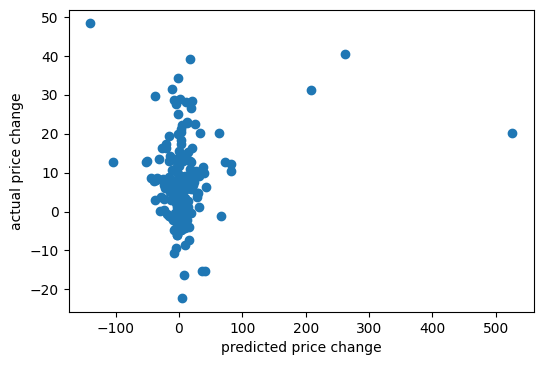

In [221]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, mean_absolute_error, mean_squared_error
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

clf = LinearRegression()
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)

print("Score:", clf.score(X_test, y_test))
plt.figure(dpi=100)
plt.scatter(y_test, predictions)
plt.xlabel('predicted price change')
plt.ylabel('actual price change')

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

[ 2.569148   -0.90478418  3.41389012 -0.67575519  1.5128794  -0.46637572
 -0.99621997 -1.72784435 -1.91594733  2.11177956]


<BarContainer object of 10 artists>

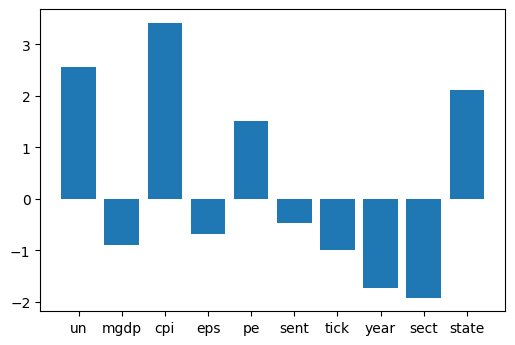

In [222]:
print(clf.coef_)
plt.figure(dpi=100)
plt.bar(['un','mgdp','cpi','eps','pe','sent','tick','year','sect','state'], clf.coef_)

Lasso Model w/o Options Volume to predict price change

Score: 0.02189157977179923
MAE: 19.379877201930054
MSE: 2164.883572103475
RMSE: 46.52830936218804
R^2 Score: 2.189157977179923
[ 2.26476421 -0.54690988  3.04142012 -0.31346989  1.12009059 -0.10229325
 -0.61966007 -1.32146404 -1.512342    1.69533617]


<BarContainer object of 10 artists>

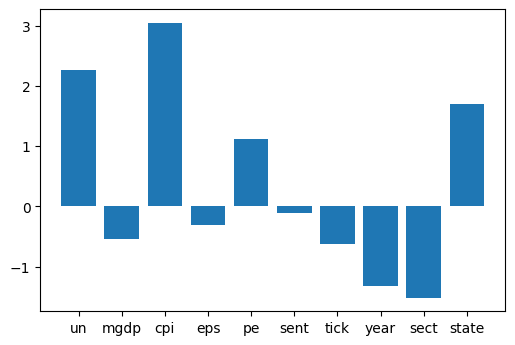

In [223]:
from sklearn.linear_model import Lasso

clf = Lasso()
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)

print("Score:", clf.score(X_test, y_test))

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

print(clf.coef_)
plt.figure(dpi=100)
plt.bar(['un','mgdp','cpi','eps','pe','sent','tick','year','sect','state'], clf.coef_)

Elastic Net w/o Options Volume to predict price change

Score: 0.020552875052561537
MAE: 19.138483740142227
MSE: 2167.8465768119913
RMSE: 46.56013935559033
[ 2.0922915  -0.61022627  2.73145635 -0.42271111  1.09513529 -0.24679262
 -0.67985662 -1.27105724 -1.41547399  1.57783897]


<BarContainer object of 10 artists>

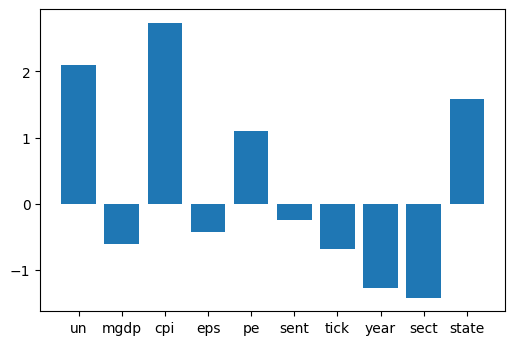

In [224]:
from sklearn.linear_model import ElasticNet


clf = ElasticNet()
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)

print("Score:", clf.score(X_test, y_test))

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))

print(clf.coef_)
plt.figure(dpi=100)
plt.bar(['un','mgdp','cpi','eps','pe','sent','tick','year','sect','state'], clf.coef_)

### Takeaways
- Our data points (factors) do not allow us to accurately predict the arbitrary change in a stock price over Q1 of a year.
- In each model the model attached to constant factors across periods, and not to variable factors that may be better at predicting this type of acute change
- We would need to include more unique factors in order to accurately predict this metric.
- IT IS VERY HARD TO PREDICT THE EXACT MOVEMENT OF A STOCK IN A QUARTER. If we could do this we would be billionares.

## Sentiment Analysis
Lets try a elastic net model with only sentiment and eps...

In [227]:
# Load in our stocks data csv
sent = pd.read_csv('sp_clean_full.csv', index_col=[0])

sent = sent[['eps_n-1','end_price','sentiment_score_n-1','year','country']]
sent = sent[sent.year != 2014]
sent = sent[sent.country == 'United States']
sent = sent.drop(columns = ['year', 'country'])
sent

,eps_n-1,end_price,sentiment_score_n-1
131,3.05,39.043472,0.502430
132,6.43,28.522703,0.392825
133,3.97,102.151405,0.509814
134,2.15,41.006710,0.524980
136,2.40,53.367020,0.503463
...,...,...,...
1043,6.98,218.770004,0.500000
1044,9.51,218.199997,0.503681
1045,1.65,67.394096,0.502219
1046,3.47,118.112984,0.506604


In [228]:
# Perform PCA
# End price corresponds to the price at the end of the first quarter in the following year
y = sent['end_price']
# DataFrame without value we are trying to predict
X = sent.drop(columns=['end_price'])

X

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardizing the features based on unit variance
X = StandardScaler().fit_transform(X)

# Testing for the ideal n_components
pca = PCA(n_components= 2) # Number of components
X2 = pca.fit_transform(X)

In [229]:
from sklearn.model_selection import train_test_split
# Split the test and train data
X_train, X_test, y_train, y_test = train_test_split(X2, y, test_size=0.25)

Score: 0.47072074113976625
MAE: 69.84732302331143
MSE: 12011.41882931307
RMSE: 109.59661869470732
[67.87391191 72.36465427]


<BarContainer object of 2 artists>

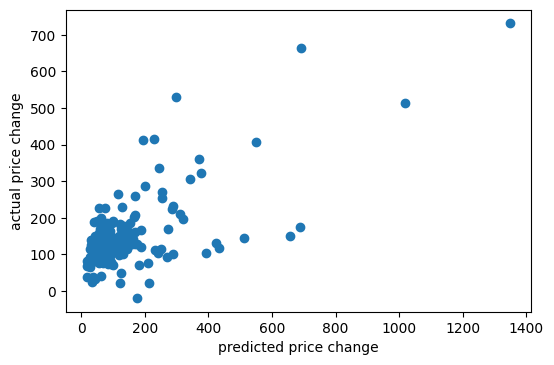

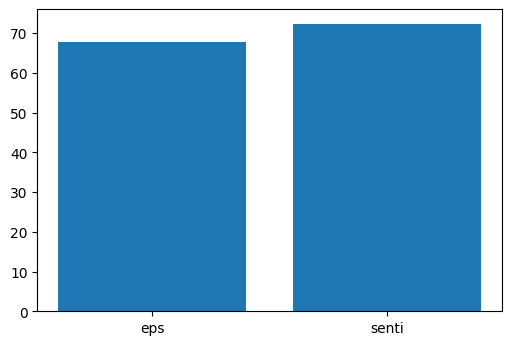

In [231]:
from sklearn.linear_model import ElasticNet


clf = ElasticNet()
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)

print("Score:", clf.score(X_test, y_test))

plt.figure(dpi=100)
plt.scatter(y_test, predictions)
plt.xlabel('predicted price change')
plt.ylabel('actual price change')

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))

print(clf.coef_)
plt.figure(dpi=100)
plt.bar(['eps','senti'], clf.coef_)

### Takeaways
- Sentiment should be explored more in a further study with various momentum indicators. It would be interesting to see how in a very short time frame how twitter sentiment affects stocks.

## Causality Assement 
We are looking to understand the effect EPS has on the price at the end of Q2.

In [232]:
# Load in our stocks data csv
caus_data = pd.read_csv('sp_clean_full.csv', index_col=[0])

caus_data = caus_data[['eps_n-1','end_price','year','country']]
caus_data = caus_data[caus_data.year != 2014]
caus_data = caus_data[caus_data.country == 'United States']
caus_data = caus_data.drop(columns = ['year', 'country'])
caus_data

,eps_n-1,end_price
131,3.05,39.043472
132,6.43,28.522703
133,3.97,102.151405
134,2.15,41.006710
136,2.40,53.367020
...,...,...
1043,6.98,218.770004
1044,9.51,218.199997
1045,1.65,67.394096
1046,3.47,118.112984


In [233]:
# Perform PCA

# End price corresponds to the price at the end of the first quarter in the following year
y = caus_data['end_price']
# DataFrame without value we are trying to predict
X = caus_data.drop(columns=['end_price'])

X

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardizing the features based on unit variance
X = StandardScaler().fit_transform(X)

# Testing for the ideal n_components
pca = PCA(n_components= 1) # Number of components
X2 = pca.fit_transform(X)

In [234]:
from sklearn.model_selection import train_test_split
# Split the test and train data
X_train, X_test, y_train, y_test = train_test_split(X2, y, test_size=0.25)

Score: 0.6379858980235159
MAE: 64.52860791492114
MSE: 15993.123997910438
RMSE: 126.46392370122966
R^2 Score: 63.79858980235159


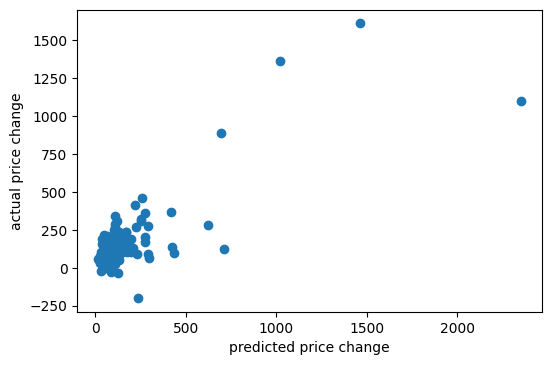

In [235]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, mean_absolute_error, mean_squared_error
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

clf = LinearRegression()
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)

print("Score:", clf.score(X_test, y_test))
plt.figure(dpi=100)
plt.xlabel('predicted price change')
plt.ylabel('actual price change')
plt.scatter(y_test, predictions)

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

In [236]:
# Record the coefficent for EPS alone
B1 = clf.coef_
print(B1)

[141.39119342]


Score: 0.9898512056717037
MAE: 15.306182163126373
MSE: 827.2715224380464
RMSE: 28.762328181808343
R^2 Score: 98.98512056717037


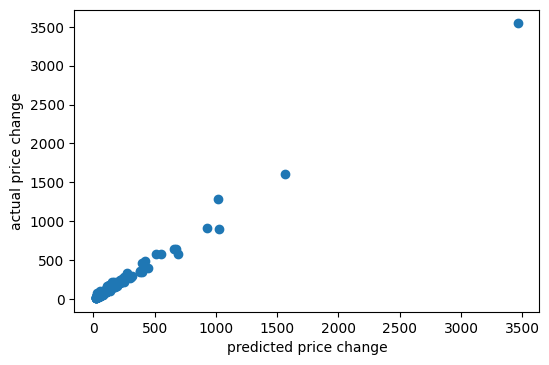

In [237]:
# Record the coefficent for the EPS with starting price
# Load in our stocks data csv
caus_data = pd.read_csv('sp_clean_full.csv', index_col=[0])

caus_data = caus_data[['eps_n-1','end_price','year','country','start_price']]
caus_data = caus_data[caus_data.year != 2014]
caus_data = caus_data[caus_data.country == 'United States']
caus_data = caus_data.drop(columns = ['year', 'country'])
caus_data

# Perform PCA
# End price corresponds to the price at the end of the first quarter in the following year
y = caus_data['end_price']
# DataFrame without value we are trying to predict
X = caus_data.drop(columns=['end_price'])

from sklearn.decomposition import PCA

X = StandardScaler().fit_transform(X)

pca = PCA(n_components= 2) # Number of components in the final data set
X2 = pca.fit_transform(X)

from sklearn.model_selection import train_test_split
# Split the test and train data
X_train, X_test, y_train, y_test = train_test_split(X2, y, test_size=0.25)

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, mean_absolute_error, mean_squared_error
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

clf = LinearRegression()
clf.fit(X_train, y_train)

predictions = clf.predict(X_test)

print("Score:", clf.score(X_test, y_test))
plt.figure(dpi=100)
plt.xlabel('predicted price change')
plt.ylabel('actual price change')
plt.scatter(y_test, predictions)

# Different error measures
print("MAE:", mean_absolute_error(y_test, predictions))
print('MSE:', mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(mean_squared_error(y_test, predictions)))
print('R^2 Score:', 100*r2_score(y_test, predictions))

In [238]:
# Record the coefficent for EPS when with starting price
B1_ = clf.coef_
print(B1)

[141.39119342]


### Takeways
- Starting price is not a confounding variable with EPS as the coefficecnt for the predictor being analyzed EPS did not change by more than 10%.
- The combination of starting price and EPS allows the model to fit rather well ~ 96%. The remaining factors fine tune the model, but do not contribute as much accuracy.

# Section 4: Challenges 
We went through an exhaustive proccess to generate a dataset of factors that we thought would affect stock prices. We pulled historical individual stock data from the yahoo finance API, government websites (as csvs/xlsx), and created our own twitter sentiment data. The data collection and aggreagtion procccess was much more complicated than we anticipated. It was very challenging to pull historical data from the yahoo finace API, because you needed to have a subscription and then it asked you to log in everytime you tried to query the https. It was also challenging to get the data in a form that would allow us to try to make a prediction for the upcoming quarter using last years data. 

We needed the data to have the previous years financial metrics assocaited with the first quarter price of this year. So we are actually making a "future" prediction that should be useful. 

Along with the data collection phase, we found the data modeling to be challenging. It is difficult to model a dataset in a short period of time and figure out what the ideal hyper-paramters are.

# Section 5: Next Steps

This project was interesting because it has various real world applications and lots of hedge funds and firms prioritize this type of modeling. It served as a great introduction to how quantitative trading firms make decisions in the US stock market. 

Although our models for the most part were not extremly succesful, it did get us thinking about tons of different models we could attempt to run and factors that we think would be interesting to explore. This type of iteration in your thinking and modeling is key for the financial industry when hundreds if not thousands of complex variables are changing everyday. 

Our group is very interested in exploring this type of analysis further and we feel this was a great introduction.